# WGU C964 Capstone - Harmful Insect Classification Model

This notebook builds an image classification model for dangerous farm insect using TensorFlow and TensorFlow Hub.

## 1. Problem

Identifying 15 common pest insects in agriculture to assist with quick identification and targeted removal methods as opposed to using all purpose (and generally more harmful) pesticides. 

## 2. Data

The data for this model consist of the following 15 insect species:
* African Honey Bee 
* Aphids
* Armyworm Moth
* Brown Marmorated Stink Bug
* Cabbage Looper Moth
* Colorado Potato Beetle
* Corn Earworm Moth
* European Corn Borer
* Flea Beetle
* Fruit Fly
* Japanese Beetle
* Spider Mite
* Thrip
* Tomato Hornworm (AKA Five-Spotted Hawk Moth)
* Western Corn Rootworm Beetle

Images for the listed species must be obtained from iNaturalist, a community platform for sharing images and observations of various flora and fauna - https://www.inaturalist.org/ 

In [1]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub
import os
from IPython.display import Image as IPImage
from IPython.display import display
import random
from PIL import Image
import datetime
import requests
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from skimage import io, transform
from mpl_toolkits.mplot3d import Axes3D

### 2.1 Downloading Species Images

iNaturalist is a valuable source for images of many different species, but does not have an easy way to download images associated with a specific species. To do so, we have to interface with the website through their API and scrape images by passing in the parameters we are interested in. 

The goal is to obtain 1000 images for each species, so we will limit the number of images downloaded. This will help to reduce modelling time for the final model. 

In [20]:
# Function to download photos from an iNaturalist observation
def download_photos(observations):
    global downloaded_count
    for obs in observations:
        if downloaded_count > 1000:
            break
        for photo in obs['photos']:
            photo_url = photo.get('url')
            
            # The following line ensures the the original image uploaded to the website is the one that is downloaded, otherwise the image will only be 75x75 pixels
            photo_url = photo_url.replace(photo_url.split('/')[-1], 'original.jpg') 
            photo_id = photo['id']
            photo_extension = photo_url.split('.')[-1]
            photo_filename = f'{photo_id}.{photo_extension}'
            photo_path = os.path.join(output_dir, photo_filename)

            # Download and save the photo
            response = requests.get(photo_url)
            if response.status_code == 200:
                with open(photo_path, 'wb') as f:
                    f.write(response.content)
                print(f'Downloaded:{downloaded_count}. {photo_filename}')
                downloaded_count += 1
            else:
                print(f'Failed to download: {photo_filename}')


# List of species to download
species_name = ['African Honey Bee',
                'Aphids',
                'Brown Marmorated Stink Bug',
                'Japanese Beetle',
                'Colorado Potato Beetle',
                'Fruit Flies',
                'Spider Mites',
                'Thrips',
                'Western Corn Rootworm Beetle',
                'Armyworm Moths',
                'Cabbage Looper Moth',
                'Corn Earworm Moth',
                'European Corn Borer Moth',
                'Flea Beetle',
                'Five-spotted Hawk Moth',
               ]

# Define the iNaturalist API endpoint for searching observations by species
api_url = 'https://api.inaturalist.org/v1/observations'

for species in species_name:
    downloaded_count = 0
    
    # Create a directory to store the downloaded photos
    output_dir = r'C:\Users\cdunb\Conda Projects\School-Project\test'
    output_dir = os.path.join(output_dir, f'{species}')  
    os.makedirs(output_dir, exist_ok=True)
    
    # Set the parameters for the API request
    params = {
        'q': species,
        'order_by': 'created_at',
        'per_page': 200,  # Number of observations per page (adjust as needed)
        'page': 1,        # Start with page 1
        'quality_grade': 'research',  # Filter for research-grade observations
        'evidence_of_presence': 'organism'
    }
    print(species)
    # Loop through paginated API responses, limiting images to 1000
    while downloaded_count<1000:
        response = requests.get(api_url, params=params)
        if response.status_code == 200:
            data = response.json()
            observations = data['results']

            if not observations:
                print('No more observations found.')
                break

            download_photos(observations)
            params['page'] += 1  # Move to the next page
        else:
            print('Failed to fetch observations.')
            break

    print('Download completed.')


Western Honey Bee
Failed to download: 322526832.jpg
Downloaded:0. 322527427.jpg
Downloaded:1. 322527520.jpg
Downloaded:2. 322527589.jpg
Failed to download: 322518711.jpg
Downloaded:3. 322514313.jpg
Failed to download: 322510270.jpg
Failed to download: 322510303.jpg
Failed to download: 322510335.jpg
Failed to download: 322510390.jpg
Failed to download: 322503760.jpg
Downloaded:4. 322499664.jpg
Downloaded:5. 322497146.jpg
Downloaded:6. 322497149.jpg
Downloaded:7. 322498646.jpg
Downloaded:8. 322489025.jpg
Failed to download: 322481865.jpg
Failed to download: 322476072.jpg
Failed to download: 322474841.jpg
Downloaded:9. 322459239.jpg
Downloaded:10. 322459224.jpg
Downloaded:11. 322459226.jpg
Downloaded:12. 322461857.jpg
Downloaded:13. 322448848.jpg
Failed to download: 322443662.jpg
Downloaded:14. 322438731.jpg
Failed to download: 322437871.jpg
Downloaded:15. 322422822.jpg
Downloaded:16. 322422854.jpg
Failed to download: 322417510.jpg
Failed to download: 322417345.jpg
Failed to download: 322

Downloaded:160. 322164690.jpg
Downloaded:161. 322161624.jpg
Failed to download: 322273306.jpg
Failed to download: 322157742.jpg
Failed to download: 322157511.jpg
Downloaded:162. 322155786.jpg
Failed to download: 322152511.jpg
Downloaded:163. 322152937.jpg
Downloaded:164. 322152974.jpg
Failed to download: 322152918.jpg
Downloaded:165. 322148438.jpg
Downloaded:166. 322148481.jpg
Downloaded:167. 322148533.jpg
Downloaded:168. 322147641.jpg
Failed to download: 322146802.jpg
Downloaded:169. 322146594.jpg
Failed to download: 322146404.jpg
Failed to download: 322145436.jpg
Downloaded:170. 322144892.jpg
Downloaded:171. 322144926.jpg
Failed to download: 322142611.jpg
Failed to download: 322141929.jpg
Failed to download: 322138681.jpg
Failed to download: 322138662.jpg
Failed to download: 322139034.jpg
Failed to download: 322138091.jpg
Failed to download: 322138427.jpg
Failed to download: 322138459.jpg
Failed to download: 322138492.jpg
Failed to download: 322138520.jpg
Failed to download: 32213526

Failed to download: 321992502.jpg
Failed to download: 321991276.jpg
Failed to download: 321991482.jpg
Failed to download: 321991758.jpg
Failed to download: 321991930.jpg
Failed to download: 321992077.jpg
Failed to download: 321992156.jpg
Failed to download: 321992248.jpg
Downloaded:248. 321990755.jpg
Downloaded:249. 321990778.jpg
Downloaded:250. 321989516.jpg
Downloaded:251. 321989502.jpg
Failed to download: 321986914.jpg
Failed to download: 321987080.jpg
Failed to download: 321987095.jpg
Failed to download: 321986610.jpg
Failed to download: 321986025.jpg
Failed to download: 321986031.jpg
Failed to download: 321985764.jpg
Failed to download: 321984432.jpg
Failed to download: 321984450.jpg
Failed to download: 321983632.jpg
Failed to download: 321983609.jpg
Failed to download: 321983628.jpg
Failed to download: 321983311.jpg
Downloaded:252. 321978956.jpg
Downloaded:253. 322005583.jpg
Downloaded:254. 321979799.jpg
Downloaded:255. 321980108.jpg
Downloaded:256. 321980290.jpg
Downloaded:257. 

Failed to download: 321875812.jpg
Downloaded:380. 321877688.jpg
Downloaded:381. 321877553.jpg
Downloaded:382. 321877091.jpg
Downloaded:383. 321875908.jpg
Downloaded:384. 321875222.jpg
Downloaded:385. 321874950.jpg
Downloaded:386. 321873387.jpg
Downloaded:387. 321872635.jpg
Downloaded:388. 321870801.jpg
Downloaded:389. 321870827.jpg
Downloaded:390. 321870854.jpg
Downloaded:391. 321870364.jpg
Downloaded:392. 321870579.jpg
Downloaded:393. 321870464.jpg
Failed to download: 321876874.jpg
Failed to download: 321876891.jpg
Failed to download: 321876932.jpg
Failed to download: 321876958.jpg
Failed to download: 321867681.jpg
Failed to download: 321867703.jpg
Failed to download: 321867730.jpg
Failed to download: 321867755.jpg
Failed to download: 321867771.jpg
Downloaded:394. 321866320.jpg
Downloaded:395. 321866353.jpg
Downloaded:396. 321866180.jpg
Failed to download: 321865779.jpg
Failed to download: 321864665.jpg
Failed to download: 321864696.jpg
Failed to download: 321864733.jpg
Failed to down

Failed to download: 321744692.jpg
Downloaded:507. 321744214.jpg
Downloaded:508. 321744380.jpg
Downloaded:509. 321744384.jpg
Failed to download: 321743711.jpg
Failed to download: 321743733.jpg
Downloaded:510. 321743574.jpg
Downloaded:511. 321743752.jpg
Downloaded:512. 321743392.jpg
Failed to download: 321688959.jpg
Failed to download: 321740401.jpg
Downloaded:513. 321740567.jpg
Downloaded:514. 321740215.jpg
Downloaded:515. 321739889.jpg
Failed to download: 321738828.jpg
Failed to download: 321738991.jpg
Failed to download: 321738992.jpg
Failed to download: 321737981.jpg
Failed to download: 321737005.jpg
Failed to download: 321737630.jpg
Downloaded:516. 321979788.jpg
Downloaded:517. 321736247.jpg
Downloaded:518. 321736161.jpg
Failed to download: 321733932.jpg
Failed to download: 321733952.jpg
Failed to download: 321733637.jpg
Failed to download: 321735566.jpg
Failed to download: 321735277.jpg
Failed to download: 321731676.jpg
Downloaded:519. 321734949.jpg
Failed to download: 321734478.jp

Failed to download: 321663324.jpg
Downloaded:648. 321658451.jpg
Downloaded:649. 321658475.jpg
Downloaded:650. 321662901.jpg
Failed to download: 321662871.jpg
Downloaded:651. 321659851.jpg
Downloaded:652. 321659880.jpg
Failed to download: 321659695.jpg
Downloaded:653. 321658965.jpg
Failed to download: 321658650.jpg
Downloaded:654. 321657634.jpg
Downloaded:655. 321657547.jpg
Failed to download: 321657548.jpg
Failed to download: 321656243.jpg
Failed to download: 321656178.jpg
Failed to download: 321655352.jpg
Downloaded:656. 321652053.jpg
Failed to download: 321649992.jpg
Downloaded:657. 321653928.jpg
Failed to download: 321653865.jpg
Failed to download: 321651720.jpg
Failed to download: 321651749.jpg
Downloaded:658. 321649882.jpg
Downloaded:659. 321649895.jpg
Failed to download: 321649428.jpg
Downloaded:660. 321646655.jpg
Downloaded:661. 321645042.jpg
Downloaded:662. 321645100.jpg
Failed to download: 321644360.jpg
Failed to download: 321644378.jpg
Failed to download: 321644402.jpg
Failed

Downloaded:803. 321544605.jpg
Downloaded:804. 321488987.jpg
Failed to download: 321488812.jpg
Downloaded:805. 321487627.jpg
Downloaded:806. 321489759.jpg
Failed to download: 321481535.jpg
Failed to download: 321480378.jpg
Failed to download: 321479892.jpg
Failed to download: 321479297.jpg
Downloaded:807. 321486866.jpg
Downloaded:808. 321485393.jpg
Failed to download: 321485183.jpg
Failed to download: 321486048.jpg
Failed to download: 321486071.jpg
Failed to download: 321486089.jpg
Failed to download: 321485200.jpg
Failed to download: 321485362.jpg
Failed to download: 321485369.jpg
Failed to download: 321485394.jpg
Failed to download: 321484749.jpg
Failed to download: 321484775.jpg
Downloaded:809. 321482432.jpg
Downloaded:810. 321482369.jpg
Downloaded:811. 321482344.jpg
Downloaded:812. 321479908.jpg
Downloaded:813. 321479936.jpg
Downloaded:814. 321479824.jpg
Downloaded:815. 321479870.jpg
Downloaded:816. 321479914.jpg
Failed to download: 321479362.jpg
Failed to download: 321477577.jpg
Do

Downloaded:979. 321400008.jpg
Downloaded:980. 321399782.jpg
Downloaded:981. 321399252.jpg
Downloaded:982. 321398868.jpg
Downloaded:983. 321398590.jpg
Downloaded:984. 321398232.jpg
Downloaded:985. 321397558.jpg
Downloaded:986. 321396569.jpg
Downloaded:987. 321396674.jpg
Downloaded:988. 321411600.jpg
Failed to download: 321393267.jpg
Downloaded:989. 321393209.jpg
Downloaded:990. 321393095.jpg
Downloaded:991. 321393025.jpg
Downloaded:992. 321392793.jpg
Downloaded:993. 321392777.jpg
Downloaded:994. 321392691.jpg
Downloaded:995. 321392530.jpg
Downloaded:996. 321392397.jpg
Downloaded:997. 321392156.jpg
Failed to download: 321391962.jpg
Downloaded:998. 321391509.jpg
Downloaded:999. 321391354.jpg
Downloaded:1000. 321391133.jpg
Download completed.
Aphids
Failed to download: 322522105.jpg
Failed to download: 322522150.jpg
Failed to download: 322522176.jpg
Failed to download: 322522209.jpg
Failed to download: 322522238.jpg
Failed to download: 322522253.jpg
Failed to download: 322522277.jpg
Failed

Failed to download: 321480002.jpg
Failed to download: 321487153.jpg
Failed to download: 321481160.jpg
Failed to download: 321481179.jpg
Failed to download: 321477599.jpg
Failed to download: 321479061.jpg
Failed to download: 321479079.jpg
Failed to download: 321476617.jpg
Failed to download: 321476634.jpg
Failed to download: 321476649.jpg
Downloaded:117. 321467418.jpg
Downloaded:118. 321466473.jpg
Downloaded:119. 321464506.jpg
Downloaded:120. 321461777.jpg
Downloaded:121. 321461832.jpg
Downloaded:122. 321461880.jpg
Downloaded:123. 321461920.jpg
Downloaded:124. 321605910.jpg
Downloaded:125. 321605925.jpg
Downloaded:126. 321605936.jpg
Downloaded:127. 321605955.jpg
Failed to download: 321442760.jpg
Failed to download: 321442784.jpg
Failed to download: 321442797.jpg
Downloaded:128. 321439273.jpg
Failed to download: 321439268.jpg
Failed to download: 321439264.jpg
Failed to download: 321435180.jpg
Failed to download: 321427902.jpg
Failed to download: 321427882.jpg
Failed to download: 32142529

Failed to download: 320655485.jpg
Failed to download: 320655507.jpg
Failed to download: 320655535.jpg
Failed to download: 320655562.jpg
Failed to download: 320655602.jpg
Downloaded:235. 320644739.jpg
Downloaded:236. 321203585.jpg
Failed to download: 320643450.jpg
Failed to download: 320639715.jpg
Failed to download: 320639747.jpg
Downloaded:237. 320634257.jpg
Failed to download: 320629676.jpg
Downloaded:238. 320625864.jpg
Downloaded:239. 320625927.jpg
Downloaded:240. 320624270.jpg
Failed to download: 320615315.jpg
Downloaded:241. 320616821.jpg
Downloaded:242. 320616713.jpg
Downloaded:243. 320616768.jpg
Failed to download: 320610373.jpg
Downloaded:244. 320628941.jpg
Downloaded:245. 320595575.jpg
Downloaded:246. 320595610.jpg
Downloaded:247. 320595656.jpg
Downloaded:248. 320590151.jpg
Downloaded:249. 320585893.jpg
Downloaded:250. 320585939.jpg
Downloaded:251. 320585997.jpg
Downloaded:252. 320586059.jpg
Downloaded:253. 320585385.jpg
Downloaded:254. 320585435.jpg
Downloaded:255. 320585527.

Downloaded:378. 320025200.jpg
Downloaded:379. 319935551.jpg
Downloaded:380. 319959632.jpg
Downloaded:381. 319930965.jpg
Failed to download: 319932952.jpg
Downloaded:382. 319926662.jpg
Downloaded:383. 319926688.jpg
Downloaded:384. 319923880.jpg
Downloaded:385. 319923886.jpg
Downloaded:386. 319923879.jpg
Downloaded:387. 319907734.jpg
Failed to download: 319905436.jpg
Downloaded:388. 319897029.jpg
Downloaded:389. 319896825.jpg
Downloaded:390. 319897092.jpg
Downloaded:391. 319892639.jpg
Downloaded:392. 319892674.jpg
Downloaded:393. 319892730.jpg
Downloaded:394. 319874868.jpg
Failed to download: 321423535.jpg
Failed to download: 319865018.jpg
Failed to download: 319865035.jpg
Failed to download: 319865047.jpg
Downloaded:395. 319851834.jpg
Downloaded:396. 319820473.jpg
Failed to download: 319805418.jpg
Failed to download: 319805616.jpg
Failed to download: 319805909.jpg
Failed to download: 319785558.jpg
Failed to download: 319785864.jpg
Failed to download: 319786470.jpg
Failed to download: 31

Downloaded:535. 318959683.jpg
Failed to download: 318956945.jpg
Downloaded:536. 318945172.jpg
Failed to download: 318939502.jpg
Failed to download: 318939754.jpg
Downloaded:537. 318933595.jpg
Failed to download: 318918569.jpg
Downloaded:538. 318906978.jpg
Downloaded:539. 318907013.jpg
Downloaded:540. 318907062.jpg
Failed to download: 318890212.jpg
Failed to download: 318882937.jpg
Failed to download: 318882966.jpg
Downloaded:541. 318861502.jpg
Failed to download: 318922054.jpg
Failed to download: 318922081.jpg
Failed to download: 318922106.jpg
Failed to download: 318857317.jpg
Downloaded:542. 318840645.jpg
Downloaded:543. 318840660.jpg
Downloaded:544. 318816083.jpg
Downloaded:545. 319059555.jpg
Downloaded:546. 318790229.jpg
Failed to download: 318788675.jpg
Failed to download: 318788690.jpg
Failed to download: 318782431.jpg
Failed to download: 318782416.jpg
Failed to download: 318782436.jpg
Failed to download: 318782446.jpg
Failed to download: 318782726.jpg
Failed to download: 31878394

Failed to download: 318153355.jpg
Failed to download: 318178152.jpg
Failed to download: 318178193.jpg
Failed to download: 318178230.jpg
Failed to download: 318148216.jpg
Failed to download: 318148465.jpg
Failed to download: 318852949.jpg
Failed to download: 318853437.jpg
Failed to download: 318852369.jpg
Failed to download: 318133646.jpg
Failed to download: 318134109.jpg
Failed to download: 318134115.jpg
Failed to download: 318134116.jpg
Failed to download: 318132370.jpg
Failed to download: 318132371.jpg
Failed to download: 318132493.jpg
Failed to download: 318132491.jpg
Failed to download: 318126306.jpg
Failed to download: 318126403.jpg
Failed to download: 318131690.jpg
Failed to download: 318116634.jpg
Failed to download: 318116165.jpg
Failed to download: 318116186.jpg
Failed to download: 318096947.jpg
Failed to download: 318096957.jpg
Failed to download: 318096963.jpg
Failed to download: 318096972.jpg
Failed to download: 318095975.jpg
Failed to download: 318096070.jpg
Failed to down

Downloaded:812. 317414911.jpg
Failed to download: 317414755.jpg
Failed to download: 317414824.jpg
Downloaded:813. 317410475.jpg
Failed to download: 317404317.jpg
Failed to download: 317404195.jpg
Failed to download: 317404198.jpg
Downloaded:814. 318922971.jpg
Failed to download: 317399315.jpg
Failed to download: 317399359.jpg
Failed to download: 317399428.jpg
Downloaded:815. 317391843.jpg
Downloaded:816. 317391863.jpg
Downloaded:817. 317391890.jpg
Failed to download: 317379479.jpg
Downloaded:818. 317369711.jpg
Downloaded:819. 317369749.jpg
Failed to download: 317366111.jpg
Failed to download: 317359595.jpg
Failed to download: 317359632.jpg
Failed to download: 317358353.jpg
Failed to download: 317358376.jpg
Failed to download: 317358397.jpg
Failed to download: 317355767.jpg
Failed to download: 317354028.jpg
Downloaded:820. 317352343.jpg
Downloaded:821. 317351517.jpg
Downloaded:822. 317335781.jpg
Downloaded:823. 317335955.jpg
Downloaded:824. 317325290.jpg
Downloaded:825. 317319715.jpg
Do

Downloaded:953. 317077294.jpg
Downloaded:954. 317077275.jpg
Downloaded:955. 317077256.jpg
Downloaded:956. 317077322.jpg
Failed to download: 316891713.jpg
Failed to download: 316890253.jpg
Failed to download: 316890256.jpg
Failed to download: 316890255.jpg
Failed to download: 316890272.jpg
Failed to download: 316887774.jpg
Failed to download: 316887773.jpg
Failed to download: 316887775.jpg
Failed to download: 316886072.jpg
Failed to download: 316886073.jpg
Failed to download: 316886071.jpg
Failed to download: 316883592.jpg
Failed to download: 316883628.jpg
Downloaded:957. 316878551.jpg
Downloaded:958. 316878715.jpg
Downloaded:959. 316878823.jpg
Downloaded:960. 316879009.jpg
Downloaded:961. 316879212.jpg
Failed to download: 316936952.jpg
Failed to download: 316871783.jpg
Failed to download: 316871782.jpg
Downloaded:962. 316869898.jpg
Failed to download: 316863378.jpg
Downloaded:963. 316857661.jpg
Failed to download: 316859009.jpg
Failed to download: 316848369.jpg
Failed to download: 3168

Failed to download: 321940748.jpg
Failed to download: 321940746.jpg
Failed to download: 321941144.jpg
Failed to download: 321934708.jpg
Failed to download: 321934715.jpg
Failed to download: 321934713.jpg
Failed to download: 321934725.jpg
Failed to download: 321937820.jpg
Downloaded:45. 321937815.jpg
Downloaded:46. 321937845.jpg
Failed to download: 321935821.jpg
Failed to download: 321927321.jpg
Downloaded:47. 321926518.jpg
Downloaded:48. 321926285.jpg
Downloaded:49. 321926306.jpg
Failed to download: 321924075.jpg
Failed to download: 321921595.jpg
Failed to download: 321921719.jpg
Failed to download: 321918226.jpg
Failed to download: 321918288.jpg
Downloaded:50. 321915163.jpg
Failed to download: 321913982.jpg
Downloaded:51. 321913039.jpg
Downloaded:52. 321904022.jpg
Downloaded:53. 321901124.jpg
Downloaded:54. 321901191.jpg
Downloaded:55. 321901222.jpg
Downloaded:56. 321901228.jpg
Downloaded:57. 321901313.jpg
Downloaded:58. 321901394.jpg
Downloaded:59. 321901402.jpg
Downloaded:60. 321901

Failed to download: 321024714.jpg
Failed to download: 321024731.jpg
Failed to download: 321024724.jpg
Failed to download: 321015223.jpg
Downloaded:183. 320977120.jpg
Downloaded:184. 320977110.jpg
Failed to download: 320968254.jpg
Failed to download: 320968291.jpg
Failed to download: 320968310.jpg
Downloaded:185. 320967208.jpg
Downloaded:186. 320958818.jpg
Downloaded:187. 320952279.jpg
Downloaded:188. 320946702.jpg
Downloaded:189. 320946707.jpg
Downloaded:190. 320946704.jpg
Downloaded:191. 320946718.jpg
Downloaded:192. 320940440.jpg
Downloaded:193. 320940542.jpg
Downloaded:194. 320936966.jpg
Failed to download: 320929666.jpg
Downloaded:195. 320926292.jpg
Downloaded:196. 320926343.jpg
Downloaded:197. 320918559.jpg
Downloaded:198. 320916406.jpg
Downloaded:199. 320912325.jpg
Failed to download: 320908625.jpg
Failed to download: 320908664.jpg
Failed to download: 320913011.jpg
Failed to download: 320899907.jpg
Failed to download: 320899952.jpg
Failed to download: 320900045.jpg
Failed to down

Failed to download: 320176246.jpg
Failed to download: 320173679.jpg
Downloaded:305. 320173294.jpg
Failed to download: 320155559.jpg
Failed to download: 320162445.jpg
Failed to download: 320162237.jpg
Failed to download: 320155146.jpg
Failed to download: 320157606.jpg
Failed to download: 320156405.jpg
Downloaded:306. 320154852.jpg
Downloaded:307. 320154878.jpg
Downloaded:308. 320154922.jpg
Failed to download: 320154843.jpg
Failed to download: 320151670.jpg
Failed to download: 320151602.jpg
Downloaded:309. 320127586.jpg
Downloaded:310. 320115533.jpg
Downloaded:311. 320112364.jpg
Downloaded:312. 320109259.jpg
Downloaded:313. 320107651.jpg
Downloaded:314. 320107661.jpg
Failed to download: 320105520.jpg
Failed to download: 320101566.jpg
Failed to download: 320098789.jpg
Failed to download: 320097329.jpg
Failed to download: 320082030.jpg
Failed to download: 320082037.jpg
Failed to download: 320082040.jpg
Failed to download: 320082046.jpg
Downloaded:315. 320081356.jpg
Downloaded:316. 32008137

Failed to download: 319446861.jpg
Failed to download: 319422647.jpg
Failed to download: 319422662.jpg
Failed to download: 319422680.jpg
Failed to download: 319417317.jpg
Failed to download: 319417352.jpg
Failed to download: 319417372.jpg
Failed to download: 319417396.jpg
Failed to download: 319675539.jpg
Downloaded:433. 319406885.jpg
Downloaded:434. 319406914.jpg
Downloaded:435. 319398567.jpg
Downloaded:436. 319395633.jpg
Downloaded:437. 319392561.jpg
Failed to download: 319388536.jpg
Failed to download: 319375819.jpg
Failed to download: 319375852.jpg
Failed to download: 319378406.jpg
Downloaded:438. 319378146.jpg
Failed to download: 319372408.jpg
Downloaded:439. 319369575.jpg
Downloaded:440. 319367103.jpg
Failed to download: 319366878.jpg
Failed to download: 319366368.jpg
Downloaded:441. 319374090.jpg
Downloaded:442. 319360249.jpg
Failed to download: 319358529.jpg
Failed to download: 319358535.jpg
Downloaded:443. 319353993.jpg
Downloaded:444. 319354190.jpg
Downloaded:445. 319354223.jp

Failed to download: 318596402.jpg
Failed to download: 318593707.jpg
Failed to download: 318593767.jpg
Failed to download: 318593812.jpg
Failed to download: 318593856.jpg
Failed to download: 318593909.jpg
Failed to download: 318593968.jpg
Failed to download: 318587180.jpg
Failed to download: 318571128.jpg
Failed to download: 318579795.jpg
Failed to download: 318579870.jpg
Downloaded:556. 318577814.jpg
Downloaded:557. 318578420.jpg
Downloaded:558. 318578419.jpg
Downloaded:559. 318572897.jpg
Downloaded:560. 318572910.jpg
Downloaded:561. 318572873.jpg
Downloaded:562. 318572876.jpg
Downloaded:563. 318572902.jpg
Failed to download: 318571405.jpg
Failed to download: 318566628.jpg
Failed to download: 318556049.jpg
Failed to download: 318556710.jpg
Failed to download: 318556757.jpg
Failed to download: 318550073.jpg
Failed to download: 318550142.jpg
Failed to download: 318547127.jpg
Downloaded:564. 318539290.jpg
Downloaded:565. 318539473.jpg
Downloaded:566. 318539413.jpg
Downloaded:567. 31853177

Downloaded:693. 317833194.jpg
Downloaded:694. 317833216.jpg
Downloaded:695. 317833235.jpg
Failed to download: 317830852.jpg
Downloaded:696. 317825120.jpg
Failed to download: 317817125.jpg
Failed to download: 317815042.jpg
Downloaded:697. 317813044.jpg
Downloaded:698. 317813046.jpg
Failed to download: 317811839.jpg
Downloaded:699. 317806631.jpg
Failed to download: 317803607.jpg
Failed to download: 317803615.jpg
Failed to download: 317803620.jpg
Failed to download: 317803624.jpg
Failed to download: 317803632.jpg
Downloaded:700. 317786339.jpg
Downloaded:701. 317856792.jpg
Failed to download: 317777864.jpg
Failed to download: 317779331.jpg
Failed to download: 317779526.jpg
Downloaded:702. 317772277.jpg
Failed to download: 317764734.jpg
Failed to download: 317764757.jpg
Failed to download: 317764771.jpg
Failed to download: 317754112.jpg
Failed to download: 317756760.jpg
Downloaded:703. 317743115.jpg
Downloaded:704. 317737846.jpg
Downloaded:705. 317723294.jpg
Failed to download: 317715872.jp

Failed to download: 317010792.jpg
Failed to download: 317007474.jpg
Failed to download: 316997407.jpg
Downloaded:829. 316994634.jpg
Downloaded:830. 316993600.jpg
Failed to download: 316986159.jpg
Downloaded:831. 316986809.jpg
Downloaded:832. 316974211.jpg
Downloaded:833. 316971680.jpg
Failed to download: 316971630.jpg
Failed to download: 316963449.jpg
Downloaded:834. 316963303.jpg
Downloaded:835. 316962067.jpg
Downloaded:836. 316962092.jpg
Downloaded:837. 316954903.jpg
Downloaded:838. 316954918.jpg
Downloaded:839. 316952845.jpg
Downloaded:840. 316952878.jpg
Failed to download: 316951980.jpg
Failed to download: 316952005.jpg
Failed to download: 316952068.jpg
Downloaded:841. 316947543.jpg
Failed to download: 316941650.jpg
Failed to download: 316941527.jpg
Failed to download: 316945660.jpg
Downloaded:842. 316940997.jpg
Downloaded:843. 316939608.jpg
Downloaded:844. 316939626.jpg
Downloaded:845. 316939644.jpg
Downloaded:846. 316939665.jpg
Failed to download: 316939607.jpg
Failed to download

Downloaded:970. 316188419.jpg
Downloaded:971. 316188421.jpg
Downloaded:972. 316188429.jpg
Downloaded:973. 316188444.jpg
Downloaded:974. 316188450.jpg
Failed to download: 316187151.jpg
Failed to download: 316180526.jpg
Failed to download: 316180221.jpg
Failed to download: 316180215.jpg
Failed to download: 316175772.jpg
Downloaded:975. 316171546.jpg
Failed to download: 316167549.jpg
Failed to download: 316169204.jpg
Downloaded:976. 316162438.jpg
Failed to download: 316159441.jpg
Failed to download: 316157300.jpg
Failed to download: 316157288.jpg
Failed to download: 316157186.jpg
Downloaded:977. 316153437.jpg
Failed to download: 316151820.jpg
Failed to download: 316151854.jpg
Failed to download: 316149921.jpg
Failed to download: 316149943.jpg
Downloaded:978. 316133025.jpg
Failed to download: 316124770.jpg
Failed to download: 316124795.jpg
Failed to download: 316104072.jpg
Failed to download: 316104112.jpg
Failed to download: 316104150.jpg
Failed to download: 316104187.jpg
Failed to downlo

Downloaded:111. 320809582.jpg
Downloaded:112. 320807607.jpg
Downloaded:113. 320804463.jpg
Downloaded:114. 320802075.jpg
Failed to download: 320797543.jpg
Downloaded:115. 320778059.jpg
Downloaded:116. 320775288.jpg
Downloaded:117. 320775099.jpg
Downloaded:118. 320757564.jpg
Downloaded:119. 320749564.jpg
Downloaded:120. 320749561.jpg
Failed to download: 320726730.jpg
Failed to download: 320723745.jpg
Failed to download: 320710624.jpg
Failed to download: 320690592.jpg
Failed to download: 320692529.jpg
Failed to download: 320692548.jpg
Failed to download: 320692569.jpg
Failed to download: 320692588.jpg
Failed to download: 320692616.jpg
Failed to download: 320679048.jpg
Failed to download: 320679075.jpg
Failed to download: 320679106.jpg
Downloaded:121. 320663551.jpg
Failed to download: 320650037.jpg
Failed to download: 320651539.jpg
Downloaded:122. 320649140.jpg
Downloaded:123. 320631752.jpg
Failed to download: 320594792.jpg
Failed to download: 320594743.jpg
Failed to download: 320594610.jp

Failed to download: 318973751.jpg
Failed to download: 318972064.jpg
Failed to download: 318970648.jpg
Failed to download: 318970673.jpg
Failed to download: 318970703.jpg
Failed to download: 318970727.jpg
Failed to download: 318951511.jpg
Downloaded:255. 318951000.jpg
Failed to download: 318944292.jpg
Failed to download: 318928943.jpg
Failed to download: 318930338.jpg
Downloaded:256. 318929740.jpg
Downloaded:257. 318920526.jpg
Downloaded:258. 318918407.jpg
Downloaded:259. 318915670.jpg
Downloaded:260. 318909730.jpg
Downloaded:261. 318886890.jpg
Downloaded:262. 318886933.jpg
Downloaded:263. 318878965.jpg
Failed to download: 318881054.jpg
Failed to download: 318881078.jpg
Failed to download: 318881105.jpg
Failed to download: 318861826.jpg
Failed to download: 318863867.jpg
Downloaded:264. 318855377.jpg
Downloaded:265. 318855429.jpg
Failed to download: 318854137.jpg
Downloaded:266. 318853902.jpg
Downloaded:267. 318831695.jpg
Downloaded:268. 318873211.jpg
Failed to download: 318812089.jpg
Do

Failed to download: 317453629.jpg
Downloaded:387. 317450654.jpg
Downloaded:388. 317445781.jpg
Downloaded:389. 317445805.jpg
Downloaded:390. 317445816.jpg
Downloaded:391. 317445827.jpg
Failed to download: 317429637.jpg
Downloaded:392. 317424022.jpg
Failed to download: 317403393.jpg
Failed to download: 317394577.jpg
Failed to download: 317387475.jpg
Failed to download: 317387501.jpg
Failed to download: 317387518.jpg
Failed to download: 317387558.jpg
Failed to download: 317387570.jpg
Failed to download: 317378210.jpg
Downloaded:393. 317374682.jpg
Downloaded:394. 317374635.jpg
Downloaded:395. 317374542.jpg
Downloaded:396. 317374491.jpg
Downloaded:397. 317364763.jpg
Downloaded:398. 317364571.jpg
Downloaded:399. 317361497.jpg
Downloaded:400. 317361537.jpg
Downloaded:401. 317355702.jpg
Downloaded:402. 317355725.jpg
Downloaded:403. 317355744.jpg
Downloaded:404. 317355771.jpg
Downloaded:405. 317342917.jpg
Downloaded:406. 317343361.jpg
Downloaded:407. 317335814.jpg
Downloaded:408. 317362840.jpg


Downloaded:521. 316101088.jpg
Downloaded:522. 316101164.jpg
Downloaded:523. 316101230.jpg
Downloaded:524. 316101300.jpg
Failed to download: 316091386.jpg
Failed to download: 316062056.jpg
Failed to download: 316062019.jpg
Downloaded:525. 316084681.jpg
Downloaded:526. 316084653.jpg
Downloaded:527. 316084625.jpg
Failed to download: 316081537.jpg
Failed to download: 316079190.jpg
Failed to download: 316077577.jpg
Failed to download: 316076357.jpg
Downloaded:528. 316074643.jpg
Downloaded:529. 316836584.jpg
Downloaded:530. 316072785.jpg
Downloaded:531. 316060048.jpg
Downloaded:532. 316060086.jpg
Downloaded:533. 316048821.jpg
Failed to download: 316017751.jpg
Failed to download: 316014549.jpg
Failed to download: 316014568.jpg
Failed to download: 316014589.jpg
Failed to download: 315991230.jpg
Failed to download: 315985070.jpg
Downloaded:534. 315980986.jpg
Downloaded:535. 315980975.jpg
Downloaded:536. 315980997.jpg
Failed to download: 315980279.jpg
Downloaded:537. 315959406.jpg
Downloaded:538

Failed to download: 315084769.jpg
Failed to download: 315081656.jpg
Downloaded:686. 315077955.jpg
Downloaded:687. 315075430.jpg
Downloaded:688. 315075468.jpg
Downloaded:689. 315075543.jpg
Downloaded:690. 315073284.jpg
Downloaded:691. 315073285.jpg
Failed to download: 315070593.jpg
Downloaded:692. 315063331.jpg
Failed to download: 315046635.jpg
Failed to download: 315046636.jpg
Failed to download: 315041798.jpg
Failed to download: 315041823.jpg
Failed to download: 315041843.jpg
Failed to download: 315039849.jpg
Downloaded:693. 315036575.jpg
Downloaded:694. 315030438.jpg
Downloaded:695. 315030471.jpg
Downloaded:696. 315002882.jpg
Downloaded:697. 315002920.jpg
Downloaded:698. 315002953.jpg
Downloaded:699. 314993793.jpg
Downloaded:700. 315253879.jpg
Downloaded:701. 315253893.jpg
Downloaded:702. 315253914.jpg
Downloaded:703. 315253936.jpg
Downloaded:704. 314993706.jpg
Downloaded:705. 314993726.jpg
Downloaded:706. 314993758.jpg
Downloaded:707. 314993782.jpg
Downloaded:708. 314993549.jpg
Down

Failed to download: 314311226.jpg
Failed to download: 314309476.jpg
Failed to download: 314309513.jpg
Failed to download: 314309543.jpg
Failed to download: 314309571.jpg
Failed to download: 314305924.jpg
Downloaded:832. 314305692.jpg
Failed to download: 314298088.jpg
Failed to download: 314287641.jpg
Downloaded:833. 314260037.jpg
Downloaded:834. 314229659.jpg
Failed to download: 314220155.jpg
Failed to download: 314220172.jpg
Failed to download: 314213077.jpg
Failed to download: 314213103.jpg
Failed to download: 314201041.jpg
Failed to download: 314198429.jpg
Failed to download: 314201680.jpg
Failed to download: 314201003.jpg
Failed to download: 314200802.jpg
Downloaded:835. 314200685.jpg
Downloaded:836. 314195956.jpg
Failed to download: 314194815.jpg
Failed to download: 314193250.jpg
Downloaded:837. 314193226.jpg
Downloaded:838. 314193254.jpg
Downloaded:839. 314193291.jpg
Downloaded:840. 314193317.jpg
Downloaded:841. 314192925.jpg
Failed to download: 314185882.jpg
Failed to download: 

Failed to download: 313518866.jpg
Downloaded:980. 313512528.jpg
Failed to download: 313510784.jpg
Failed to download: 313510787.jpg
Downloaded:981. 313509060.jpg
Failed to download: 313503036.jpg
Downloaded:982. 313470823.jpg
Failed to download: 313493282.jpg
Failed to download: 313487691.jpg
Downloaded:983. 313493302.jpg
Failed to download: 313487795.jpg
Failed to download: 313487814.jpg
Downloaded:984. 313487005.jpg
Downloaded:985. 313486937.jpg
Downloaded:986. 313486951.jpg
Failed to download: 313466801.jpg
Downloaded:987. 313472843.jpg
Downloaded:988. 313463858.jpg
Failed to download: 314497452.jpg
Failed to download: 313458382.jpg
Failed to download: 313458409.jpg
Failed to download: 313458429.jpg
Downloaded:989. 313448824.jpg
Downloaded:990. 320201757.jpg
Downloaded:991. 320223921.jpg
Downloaded:992. 320223989.jpg
Failed to download: 313447577.jpg
Failed to download: 313447599.jpg
Failed to download: 313447621.jpg
Downloaded:993. 313444870.jpg
Failed to download: 313435562.jpg
Fa

Failed to download: 315325948.jpg
Downloaded:81. 315324440.jpg
Downloaded:82. 315322476.jpg
Failed to download: 315293594.jpg
Downloaded:83. 315252004.jpg
Failed to download: 315185369.jpg
Downloaded:84. 315161255.jpg
Downloaded:85. 315161254.jpg
Downloaded:86. 315161250.jpg
Downloaded:87. 314942531.jpg
Downloaded:88. 314942568.jpg
Failed to download: 314979885.jpg
Failed to download: 314979904.jpg
Downloaded:89. 314921966.jpg
Downloaded:90. 314905551.jpg
Failed to download: 314880189.jpg
Failed to download: 314822344.jpg
Failed to download: 314757594.jpg
Failed to download: 314725729.jpg
Downloaded:91. 314652771.jpg
Failed to download: 314630405.jpg
Failed to download: 314600935.jpg
Failed to download: 314510195.jpg
Failed to download: 314510309.jpg
Failed to download: 314510445.jpg
Failed to download: 314420232.jpg
Failed to download: 314374186.jpg
Failed to download: 314366938.jpg
Failed to download: 314367458.jpg
Failed to download: 314367482.jpg
Failed to download: 314367516.jpg
F

Downloaded:173. 311624027.jpg
Downloaded:174. 311624044.jpg
Downloaded:175. 311628122.jpg
Failed to download: 311608917.jpg
Failed to download: 311608966.jpg
Failed to download: 311606322.jpg
Failed to download: 311587340.jpg
Failed to download: 311587382.jpg
Failed to download: 311586585.jpg
Failed to download: 311586628.jpg
Downloaded:176. 311577336.jpg
Downloaded:177. 311550993.jpg
Failed to download: 311550688.jpg
Failed to download: 311550710.jpg
Failed to download: 311550744.jpg
Downloaded:178. 311535922.jpg
Downloaded:179. 311535982.jpg
Downloaded:180. 311536017.jpg
Downloaded:181. 311536066.jpg
Downloaded:182. 311536112.jpg
Downloaded:183. 311536151.jpg
Downloaded:184. 311536217.jpg
Downloaded:185. 311536277.jpg
Failed to download: 311529770.jpg
Downloaded:186. 311525418.jpg
Failed to download: 311509028.jpg
Failed to download: 311509070.jpg
Failed to download: 311487327.jpg
Failed to download: 311487354.jpg
Failed to download: 311467468.jpg
Failed to download: 311407269.jpg
Do

Downloaded:264. 308864116.jpg
Downloaded:265. 308864217.jpg
Failed to download: 308853363.jpg
Downloaded:266. 308838351.jpg
Downloaded:267. 308838375.jpg
Downloaded:268. 308838387.jpg
Downloaded:269. 308830011.jpg
Downloaded:270. 308829988.jpg
Downloaded:271. 308830042.jpg
Downloaded:272. 308823895.jpg
Downloaded:273. 308824122.jpg
Downloaded:274. 308824277.jpg
Downloaded:275. 308824441.jpg
Downloaded:276. 310457942.jpg
Downloaded:277. 308807290.jpg
Downloaded:278. 308807311.jpg
Failed to download: 308802933.jpg
Failed to download: 308802970.jpg
Failed to download: 312871949.jpg
Failed to download: 308778791.jpg
Failed to download: 308778824.jpg
Failed to download: 308778862.jpg
Failed to download: 308778901.jpg
Downloaded:279. 308772418.jpg
Downloaded:280. 308759922.jpg
Failed to download: 308751204.jpg
Failed to download: 308751254.jpg
Failed to download: 308733384.jpg
Failed to download: 308733484.jpg
Failed to download: 308733508.jpg
Downloaded:281. 308702911.jpg
Downloaded:282. 30

Failed to download: 306082117.jpg
Failed to download: 306082151.jpg
Failed to download: 306082174.jpg
Failed to download: 306061823.jpg
Downloaded:348. 306010123.jpg
Failed to download: 305955975.jpg
Failed to download: 305950836.jpg
Failed to download: 305948991.jpg
Failed to download: 305949007.jpg
Downloaded:349. 305902532.jpg
Downloaded:350. 305901941.jpg
Failed to download: 305891272.jpg
Downloaded:351. 305877451.jpg
Failed to download: 305874042.jpg
Failed to download: 305874077.jpg
Downloaded:352. 305845813.jpg
Downloaded:353. 307536460.jpg
Downloaded:354. 307536507.jpg
Downloaded:355. 307536573.jpg
Downloaded:356. 307536745.jpg
Failed to download: 305845341.jpg
Downloaded:357. 305841886.jpg
Downloaded:358. 305799939.jpg
Downloaded:359. 305797863.jpg
Failed to download: 305866266.jpg
Downloaded:360. 305791360.jpg
Downloaded:361. 305791669.jpg
Downloaded:362. 305791697.jpg
Downloaded:363. 305791713.jpg
Downloaded:364. 305787263.jpg
Failed to download: 305780099.jpg
Failed to down

Failed to download: 303570534.jpg
Downloaded:444. 304144533.jpg
Failed to download: 303549640.jpg
Failed to download: 303526060.jpg
Failed to download: 303526097.jpg
Failed to download: 303516365.jpg
Downloaded:445. 303491423.jpg
Downloaded:446. 303491459.jpg
Downloaded:447. 303491491.jpg
Failed to download: 303487400.jpg
Downloaded:448. 303441635.jpg
Downloaded:449. 303442884.jpg
Downloaded:450. 303435579.jpg
Downloaded:451. 303435593.jpg
Downloaded:452. 303435605.jpg
Downloaded:453. 303395714.jpg
Downloaded:454. 303395592.jpg
Failed to download: 303308951.jpg
Failed to download: 303295746.jpg
Failed to download: 303247030.jpg
Downloaded:455. 303533462.jpg
Downloaded:456. 303201606.jpg
Failed to download: 303185412.jpg
Downloaded:457. 303180244.jpg
Failed to download: 303157569.jpg
Downloaded:458. 303143299.jpg
Failed to download: 303142585.jpg
Failed to download: 303142301.jpg
Failed to download: 303147630.jpg
Downloaded:459. 303133608.jpg
Failed to download: 303132950.jpg
Downloaded

Failed to download: 300557487.jpg
Downloaded:552. 300519118.jpg
Failed to download: 300512295.jpg
Failed to download: 300512385.jpg
Failed to download: 300512468.jpg
Failed to download: 300512572.jpg
Downloaded:553. 300488469.jpg
Downloaded:554. 300490367.jpg
Downloaded:555. 302409551.jpg
Failed to download: 300476665.jpg
Downloaded:556. 300457218.jpg
Failed to download: 300456974.jpg
Downloaded:557. 300437452.jpg
Downloaded:558. 300437473.jpg
Downloaded:559. 300437518.jpg
Downloaded:560. 300437542.jpg
Downloaded:561. 300430101.jpg
Downloaded:562. 300436134.jpg
Downloaded:563. 300436133.jpg
Downloaded:564. 300418472.jpg
Downloaded:565. 300414124.jpg
Downloaded:566. 300403861.jpg
Failed to download: 300394520.jpg
Downloaded:567. 300376519.jpg
Failed to download: 300367865.jpg
Failed to download: 300367902.jpg
Failed to download: 300364511.jpg
Failed to download: 300363502.jpg
Failed to download: 300363515.jpg
Failed to download: 300276418.jpg
Failed to download: 300271822.jpg
Failed to 

Failed to download: 298093659.jpg
Failed to download: 298093708.jpg
Failed to download: 298093754.jpg
Failed to download: 298093150.jpg
Failed to download: 298093191.jpg
Failed to download: 298093229.jpg
Failed to download: 298093268.jpg
Failed to download: 298093312.jpg
Failed to download: 298093363.jpg
Failed to download: 298093405.jpg
Failed to download: 298053655.jpg
Failed to download: 298017966.jpg
Failed to download: 298016760.jpg
Downloaded:644. 298011018.jpg
Downloaded:645. 298011037.jpg
Downloaded:646. 297980091.jpg
Failed to download: 297979697.jpg
Downloaded:647. 298771265.jpg
Downloaded:648. 297972823.jpg
Failed to download: 297966899.jpg
Failed to download: 297966925.jpg
Failed to download: 297966953.jpg
Failed to download: 297964911.jpg
Failed to download: 297964350.jpg
Downloaded:649. 297944602.jpg
Downloaded:650. 297944622.jpg
Downloaded:651. 297893273.jpg
Downloaded:652. 297887624.jpg
Downloaded:653. 297887652.jpg
Downloaded:654. 297887689.jpg
Downloaded:655. 29788772

Downloaded:763. 295654112.jpg
Downloaded:764. 295654175.jpg
Failed to download: 295643843.jpg
Failed to download: 295637971.jpg
Failed to download: 295632410.jpg
Failed to download: 295632451.jpg
Failed to download: 295617607.jpg
Failed to download: 295617684.jpg
Failed to download: 295608138.jpg
Failed to download: 295599135.jpg
Failed to download: 295599165.jpg
Failed to download: 295599187.jpg
Failed to download: 295593133.jpg
Failed to download: 295593148.jpg
Failed to download: 295588492.jpg
Failed to download: 295588517.jpg
Downloaded:765. 295580671.jpg
Failed to download: 295576680.jpg
Downloaded:766. 295565975.jpg
Downloaded:767. 295565169.jpg
Failed to download: 295568665.jpg
Downloaded:768. 295561945.jpg
Failed to download: 295553523.jpg
Downloaded:769. 295548594.jpg
Downloaded:770. 295548588.jpg
Downloaded:771. 295443230.jpg
Downloaded:772. 295398199.jpg
Downloaded:773. 295398229.jpg
Failed to download: 295390718.jpg
Failed to download: 295390587.jpg
Failed to download: 2953

Failed to download: 293035086.jpg
Failed to download: 293013270.jpg
Failed to download: 293013358.jpg
Failed to download: 293013373.jpg
Failed to download: 298512434.jpg
Failed to download: 298512500.jpg
Failed to download: 298512552.jpg
Failed to download: 298512607.jpg
Failed to download: 298511452.jpg
Failed to download: 298511500.jpg
Failed to download: 298511540.jpg
Failed to download: 298511576.jpg
Failed to download: 298511622.jpg
Failed to download: 293008197.jpg
Failed to download: 293008224.jpg
Failed to download: 293008251.jpg
Downloaded:861. 292974462.jpg
Downloaded:862. 292974516.jpg
Downloaded:863. 292974602.jpg
Downloaded:864. 292974673.jpg
Failed to download: 292957532.jpg
Failed to download: 292900682.jpg
Failed to download: 292895900.jpg
Failed to download: 292892782.jpg
Failed to download: 292892790.jpg
Failed to download: 292892802.jpg
Failed to download: 292892819.jpg
Failed to download: 292892829.jpg
Failed to download: 292892214.jpg
Failed to download: 292870273.

Failed to download: 290496539.jpg
Failed to download: 290496571.jpg
Failed to download: 290496592.jpg
Downloaded:943. 290448095.jpg
Downloaded:944. 290448109.jpg
Downloaded:945. 290447968.jpg
Downloaded:946. 290447980.jpg
Downloaded:947. 290447995.jpg
Failed to download: 290410812.jpg
Downloaded:948. 290392567.jpg
Downloaded:949. 290392580.jpg
Downloaded:950. 290360074.jpg
Downloaded:951. 290360106.jpg
Downloaded:952. 290335392.jpg
Downloaded:953. 290335505.jpg
Downloaded:954. 290335457.jpg
Failed to download: 290323943.jpg
Failed to download: 290323956.jpg
Failed to download: 290323961.jpg
Failed to download: 290323974.jpg
Failed to download: 290323983.jpg
Failed to download: 290323993.jpg
Failed to download: 290324004.jpg
Failed to download: 290324015.jpg
Failed to download: 290307767.jpg
Failed to download: 290307803.jpg
Failed to download: 290307837.jpg
Downloaded:955. 290281272.jpg
Downloaded:956. 290280854.jpg
Failed to download: 290274257.jpg
Failed to download: 290268877.jpg
Fa

Failed to download: 318990252.jpg
Failed to download: 318990253.jpg
Failed to download: 318838956.jpg
Failed to download: 318838955.jpg
Failed to download: 318832036.jpg
Failed to download: 318832047.jpg
Downloaded:34. 318560519.jpg
Downloaded:35. 318564939.jpg
Downloaded:36. 318565455.jpg
Downloaded:37. 318565803.jpg
Downloaded:38. 318566003.jpg
Downloaded:39. 318566160.jpg
Downloaded:40. 318566274.jpg
Downloaded:41. 318566582.jpg
Downloaded:42. 318566685.jpg
Downloaded:43. 318566784.jpg
Downloaded:44. 318566916.jpg
Downloaded:45. 318568056.jpg
Downloaded:46. 318568784.jpg
Downloaded:47. 318568954.jpg
Downloaded:48. 318569080.jpg
Downloaded:49. 318569182.jpg
Downloaded:50. 318569437.jpg
Downloaded:51. 318569549.jpg
Downloaded:52. 318569690.jpg
Downloaded:53. 318569798.jpg
Downloaded:54. 318493771.jpg
Downloaded:55. 318493822.jpg
Downloaded:56. 318493852.jpg
Downloaded:57. 318493882.jpg
Failed to download: 318614475.jpg
Failed to download: 318469994.jpg
Failed to download: 318394221.jp

Downloaded:156. 313577807.jpg
Downloaded:157. 313577815.jpg
Downloaded:158. 313577827.jpg
Downloaded:159. 313577659.jpg
Downloaded:160. 313577686.jpg
Downloaded:161. 313577718.jpg
Downloaded:162. 313577760.jpg
Downloaded:163. 313529281.jpg
Failed to download: 313478101.jpg
Failed to download: 313472140.jpg
Failed to download: 313472151.jpg
Downloaded:164. 313465843.jpg
Downloaded:165. 313465797.jpg
Failed to download: 313234727.jpg
Failed to download: 313234744.jpg
Downloaded:166. 313218306.jpg
Downloaded:167. 313218301.jpg
Downloaded:168. 313103211.jpg
Failed to download: 313098313.jpg
Failed to download: 313098310.jpg
Downloaded:169. 313090550.jpg
Failed to download: 312964495.jpg
Failed to download: 312964521.jpg
Failed to download: 312964546.jpg
Failed to download: 312951656.jpg
Downloaded:170. 312942840.jpg
Failed to download: 312890889.jpg
Failed to download: 312890888.jpg
Failed to download: 312890894.jpg
Failed to download: 312890899.jpg
Failed to download: 312890883.jpg
Downlo

Failed to download: 307673595.jpg
Failed to download: 307649804.jpg
Failed to download: 307649838.jpg
Failed to download: 307649871.jpg
Failed to download: 307649901.jpg
Failed to download: 307649926.jpg
Failed to download: 307605440.jpg
Failed to download: 307605456.jpg
Failed to download: 307605480.jpg
Downloaded:269. 307559439.jpg
Failed to download: 307487291.jpg
Failed to download: 307483540.jpg
Failed to download: 307387041.jpg
Failed to download: 307387095.jpg
Failed to download: 307387131.jpg
Failed to download: 307387180.jpg
Downloaded:270. 307361514.jpg
Failed to download: 307353745.jpg
Downloaded:271. 307280661.jpg
Downloaded:272. 307280666.jpg
Downloaded:273. 307231985.jpg
Failed to download: 307140964.jpg
Failed to download: 307140998.jpg
Failed to download: 316064038.jpg
Failed to download: 316064075.jpg
Failed to download: 316064113.jpg
Downloaded:274. 307079313.jpg
Downloaded:275. 307071062.jpg
Failed to download: 307023277.jpg
Failed to download: 307023291.jpg
Failed t

Failed to download: 302205177.jpg
Failed to download: 302205187.jpg
Failed to download: 302110138.jpg
Failed to download: 302114042.jpg
Failed to download: 302114047.jpg
Failed to download: 302114051.jpg
Failed to download: 302100704.jpg
Failed to download: 302100721.jpg
Failed to download: 302100739.jpg
Failed to download: 302100755.jpg
Failed to download: 302100768.jpg
Failed to download: 302100786.jpg
Failed to download: 302100804.jpg
Failed to download: 302053690.jpg
Failed to download: 301979526.jpg
Failed to download: 301971478.jpg
Failed to download: 301971902.jpg
Failed to download: 301971943.jpg
Failed to download: 301920368.jpg
Failed to download: 301920407.jpg
Failed to download: 301920453.jpg
Downloaded:376. 301866762.jpg
Failed to download: 301775598.jpg
Downloaded:377. 301712339.jpg
Failed to download: 301682500.jpg
Failed to download: 301682544.jpg
Failed to download: 301682523.jpg
Failed to download: 301682561.jpg
Failed to download: 301682588.jpg
Failed to download: 30

Failed to download: 296161100.jpg
Downloaded:463. 296027712.jpg
Downloaded:464. 296027738.jpg
Downloaded:465. 296027772.jpg
Downloaded:466. 296027813.jpg
Failed to download: 296004346.jpg
Failed to download: 296004361.jpg
Downloaded:467. 295938504.jpg
Downloaded:468. 295913712.jpg
Failed to download: 295913969.jpg
Failed to download: 295913982.jpg
Failed to download: 295913987.jpg
Failed to download: 295914045.jpg
Failed to download: 295914046.jpg
Downloaded:469. 295833290.jpg
Downloaded:470. 295758326.jpg
Downloaded:471. 295664278.jpg
Downloaded:472. 295664311.jpg
Downloaded:473. 295664341.jpg
Downloaded:474. 295664366.jpg
Downloaded:475. 295664383.jpg
Downloaded:476. 295617714.jpg
Failed to download: 295601204.jpg
Failed to download: 295601250.jpg
Downloaded:477. 295561555.jpg
Failed to download: 295511437.jpg
Failed to download: 295511502.jpg
Failed to download: 295511293.jpg
Downloaded:478. 295443395.jpg
Failed to download: 295439159.jpg
Failed to download: 295422981.jpg
Failed to 

Failed to download: 285598057.jpg
Failed to download: 285590192.jpg
Failed to download: 285590218.jpg
Failed to download: 285590230.jpg
Failed to download: 285590240.jpg
Failed to download: 285630276.jpg
Failed to download: 285368327.jpg
Failed to download: 285296416.jpg
Failed to download: 285296439.jpg
Downloaded:568. 285301824.jpg
Downloaded:569. 285301892.jpg
Failed to download: 285134287.jpg
Downloaded:570. 285005111.jpg
Failed to download: 284985517.jpg
Downloaded:571. 284987339.jpg
Failed to download: 284969364.jpg
Failed to download: 284945578.jpg
Failed to download: 284783185.jpg
Failed to download: 284706549.jpg
Failed to download: 284706564.jpg
Failed to download: 284706596.jpg
Failed to download: 284706645.jpg
Failed to download: 284706650.jpg
Failed to download: 284706692.jpg
Failed to download: 284706707.jpg
Failed to download: 284706730.jpg
Downloaded:572. 284605211.jpg
Downloaded:573. 284473222.jpg
Downloaded:574. 284453221.jpg
Failed to download: 284417113.jpg
Failed t

Failed to download: 269739561.jpg
Failed to download: 269739577.jpg
Downloaded:649. 269610051.jpg
Downloaded:650. 269610077.jpg
Downloaded:651. 269610102.jpg
Downloaded:652. 269610131.jpg
Failed to download: 269559898.jpg
Failed to download: 269559918.jpg
Failed to download: 269559945.jpg
Failed to download: 269559971.jpg
Failed to download: 269559999.jpg
Failed to download: 269560031.jpg
Failed to download: 269560061.jpg
Failed to download: 269560086.jpg
Downloaded:653. 269550061.jpg
Downloaded:654. 269550087.jpg
Downloaded:655. 269550114.jpg
Failed to download: 269394806.jpg
Failed to download: 269394828.jpg
Failed to download: 269394851.jpg
Failed to download: 269394871.jpg
Failed to download: 269394893.jpg
Failed to download: 269394914.jpg
Failed to download: 269394931.jpg
Failed to download: 269394952.jpg
Failed to download: 269394972.jpg
Failed to download: 269394997.jpg
Failed to download: 269395024.jpg
Failed to download: 269395039.jpg
Failed to download: 269395062.jpg
Download

Downloaded:764. 261764728.jpg
Downloaded:765. 261765467.jpg
Failed to download: 261765481.jpg
Failed to download: 261617939.jpg
Failed to download: 261617960.jpg
Failed to download: 261617983.jpg
Failed to download: 261618011.jpg
Failed to download: 261420474.jpg
Downloaded:766. 261388994.jpg
Failed to download: 261247380.jpg
Failed to download: 260970575.jpg
Failed to download: 260970521.jpg
Failed to download: 260970566.jpg
Failed to download: 260837234.jpg
Failed to download: 260807508.jpg
Failed to download: 260807517.jpg
Failed to download: 260807529.jpg
Failed to download: 260807537.jpg
Failed to download: 260807546.jpg
Failed to download: 260807556.jpg
Failed to download: 260807562.jpg
Failed to download: 260807568.jpg
Failed to download: 260807574.jpg
Failed to download: 260708137.jpg
Failed to download: 260567083.jpg
Failed to download: 260567097.jpg
Failed to download: 260567100.jpg
Downloaded:767. 260567718.jpg
Failed to download: 260547747.jpg
Failed to download: 260509145.

Failed to download: 256049346.jpg
Downloaded:877. 256001563.jpg
Downloaded:878. 256001588.jpg
Failed to download: 255948375.jpg
Failed to download: 255948387.jpg
Failed to download: 255948398.jpg
Failed to download: 255948410.jpg
Failed to download: 255948422.jpg
Failed to download: 255948447.jpg
Failed to download: 255948468.jpg
Failed to download: 255948480.jpg
Failed to download: 255948495.jpg
Failed to download: 255948508.jpg
Downloaded:879. 255825936.jpg
Downloaded:880. 255825896.jpg
Downloaded:881. 255825923.jpg
Failed to download: 256017115.jpg
Downloaded:882. 255820565.jpg
Downloaded:883. 255820578.jpg
Failed to download: 255790053.jpg
Failed to download: 255790064.jpg
Failed to download: 255790074.jpg
Failed to download: 255790084.jpg
Downloaded:884. 255780204.jpg
Failed to download: 255743873.jpg
Failed to download: 255743885.jpg
Failed to download: 255743894.jpg
Failed to download: 255743906.jpg
Failed to download: 255743915.jpg
Failed to download: 255733631.jpg
Failed to do

Failed to download: 251663959.jpg
Failed to download: 251663964.jpg
Failed to download: 251663965.jpg
Failed to download: 251655751.jpg
Failed to download: 251605506.jpg
Failed to download: 251542504.jpg
Failed to download: 251537286.jpg
Failed to download: 251537246.jpg
Downloaded:966. 251419749.jpg
Downloaded:967. 251419765.jpg
Downloaded:968. 251410500.jpg
Downloaded:969. 251410508.jpg
Downloaded:970. 251410515.jpg
Downloaded:971. 251418711.jpg
Failed to download: 251321070.jpg
Failed to download: 251321077.jpg
Failed to download: 251321091.jpg
Failed to download: 251321103.jpg
Failed to download: 251321114.jpg
Failed to download: 251321125.jpg
Failed to download: 251321131.jpg
Failed to download: 251321137.jpg
Failed to download: 252133756.jpg
Failed to download: 251312470.jpg
Failed to download: 251312468.jpg
Failed to download: 251312476.jpg
Failed to download: 251312452.jpg
Failed to download: 251312419.jpg
Failed to download: 251312501.jpg
Failed to download: 251312439.jpg
Fail

Failed to download: 267749171.jpg
Failed to download: 267104162.jpg
Downloaded:74. 266416386.jpg
Failed to download: 264233917.jpg
Failed to download: 264234016.jpg
Failed to download: 263081067.jpg
Downloaded:75. 262913358.jpg
Downloaded:76. 262913467.jpg
Downloaded:77. 262913627.jpg
Downloaded:78. 262913770.jpg
Downloaded:79. 262497155.jpg
Downloaded:80. 262497182.jpg
Downloaded:81. 260940681.jpg
Downloaded:82. 260940700.jpg
Downloaded:83. 260940742.jpg
Downloaded:84. 260171577.jpg
Downloaded:85. 260171606.jpg
Failed to download: 259791208.jpg
Failed to download: 259791213.jpg
Downloaded:86. 259790940.jpg
Downloaded:87. 259790983.jpg
Downloaded:88. 259790950.jpg
Downloaded:89. 259790961.jpg
Downloaded:90. 259790966.jpg
Downloaded:91. 259790973.jpg
Downloaded:92. 259790977.jpg
Downloaded:93. 259790989.jpg
Downloaded:94. 258792629.jpg
Failed to download: 257052206.jpg
Failed to download: 257052229.jpg
Failed to download: 257052281.jpg
Downloaded:95. 256222046.jpg
Failed to download: 25

Downloaded:186. 198968580.jpg
Downloaded:187. 198968558.jpg
Downloaded:188. 198968603.jpg
Downloaded:189. 198968627.jpg
Failed to download: 197721142.jpg
Failed to download: 197709219.jpg
Failed to download: 197709225.jpg
Failed to download: 197709239.jpg
Failed to download: 197175453.jpg
Failed to download: 197175438.jpg
Downloaded:190. 195705151.jpg
Downloaded:191. 195705104.jpg
Downloaded:192. 195705073.jpg
Downloaded:193. 195422033.jpg
Downloaded:194. 195422014.jpg
Downloaded:195. 195421988.jpg
Failed to download: 194630149.jpg
Failed to download: 194630180.jpg
Downloaded:196. 194507770.jpg
Downloaded:197. 194507883.jpg
Downloaded:198. 196869658.jpg
Downloaded:199. 196869675.jpg
Downloaded:200. 194293455.jpg
Downloaded:201. 194293475.jpg
Downloaded:202. 194293494.jpg
Downloaded:203. 194293514.jpg
Downloaded:204. 194098453.jpg
Downloaded:205. 194098578.jpg
Downloaded:206. 194098765.jpg
Failed to download: 194098899.jpg
Failed to download: 193502812.jpg
Failed to download: 193502924.

Failed to download: 148548635.jpg
Failed to download: 148548540.jpg
Failed to download: 148548596.jpg
Downloaded:292. 146945363.jpg
Downloaded:293. 146945385.jpg
Downloaded:294. 146945400.jpg
Downloaded:295. 146945423.jpg
Downloaded:296. 146932555.jpg
Downloaded:297. 146932698.jpg
Downloaded:298. 146932735.jpg
Downloaded:299. 146932772.jpg
Failed to download: 146449953.jpg
Failed to download: 146450011.jpg
Failed to download: 146450035.jpg
Failed to download: 146193311.jpg
Downloaded:300. 145737480.jpg
Downloaded:301. 145737503.jpg
Downloaded:302. 145737536.jpg
Downloaded:303. 145737325.jpg
Downloaded:304. 145737354.jpg
Downloaded:305. 145737385.jpg
Downloaded:306. 145736956.jpg
Downloaded:307. 145736874.jpg
Downloaded:308. 145737123.jpg
Downloaded:309. 145737169.jpg
Downloaded:310. 145737207.jpg
Downloaded:311. 145736542.jpg
Downloaded:312. 145736454.jpg
Downloaded:313. 145736502.jpg
Downloaded:314. 145735290.jpg
Downloaded:315. 145735328.jpg
Downloaded:316. 145735358.jpg
Downloaded:3

Downloaded:423. 103094468.jpg
Downloaded:424. 103094476.jpg
Downloaded:425. 102618701.jpg
Failed to download: 102470827.jpg
Downloaded:426. 102256135.jpg
Downloaded:427. 102256142.jpg
Downloaded:428. 102256151.jpg
Downloaded:429. 101851828.jpg
Downloaded:430. 101851824.jpg
Downloaded:431. 101851822.jpg
Downloaded:432. 101851807.jpg
Downloaded:433. 101851797.jpg
Downloaded:434. 101851801.jpg
Downloaded:435. 98266159.jpg
Downloaded:436. 98266175.jpg
Downloaded:437. 98266197.jpg
Downloaded:438. 98266185.jpg
Downloaded:439. 98266107.jpg
Failed to download: 96906723.jpg
Downloaded:440. 95584558.jpg
Failed to download: 94143685.jpg
Failed to download: 94143695.jpg
Failed to download: 93035252.jpg
Failed to download: 93035258.jpg
Downloaded:441. 91857893.jpg
Downloaded:442. 91858243.jpg
Downloaded:443. 91860318.jpg
Downloaded:444. 91170990.jpg
Failed to download: 90880878.jpg
Downloaded:445. 90880887.jpg
Failed to download: 90854201.jpg
Failed to download: 90854220.jpg
Failed to download: 908

Downloaded:554. 37999512.jpg
Downloaded:555. 37998662.jpg
Downloaded:556. 37998581.jpg
Downloaded:557. 37875352.jpg
Downloaded:558. 37875339.jpg
Downloaded:559. 37382099.jpg
Downloaded:560. 37382123.jpg
Downloaded:561. 37382073.jpg
Downloaded:562. 37381782.jpg
Downloaded:563. 37381763.jpg
Downloaded:564. 37381797.jpg
Downloaded:565. 37380836.jpg
Downloaded:566. 37380781.jpg
Downloaded:567. 37380612.jpg
Downloaded:568. 37377311.jpg
Downloaded:569. 37377350.jpg
Downloaded:570. 37377345.jpg
Downloaded:571. 37377332.jpg
Failed to download: 36417401.jpg
Downloaded:572. 36133852.jpg
Downloaded:573. 36133748.jpg
Downloaded:574. 36133776.jpg
Downloaded:575. 36031294.jpg
Downloaded:576. 36027209.jpg
Downloaded:577. 36027400.jpg
Failed to download: 36009419.jpg
Downloaded:578. 35812591.jpg
Failed to download: 35712871.jpg
Failed to download: 35713084.jpg
Downloaded:579. 35708839.jpg
Failed to download: 35673089.jpg
Downloaded:580. 35642446.jpg
Downloaded:581. 35641062.jpg
Downloaded:582. 3564093

Failed to download: 12747752.jpg
Downloaded:700. 12747736.jpg
Downloaded:701. 12747757.jpg
Failed to download: 12747747.jpg
Failed to download: 12747751.jpg
Failed to download: 12747755.jpg
Failed to download: 12255528.jpg
Failed to download: 12255532.jpg
Failed to download: 12255533.jpg
Failed to download: 12255534.jpg
Failed to download: 12255535.jpg
Failed to download: 12255536.jpg
Downloaded:702. 12226687.jpg
Downloaded:703. 12226834.jpg
Failed to download: 11779479.jpg
Failed to download: 11696392.jpg
Failed to download: 11696393.jpg
Downloaded:704. 11616019.jpg
Failed to download: 11429902.jpg
Failed to download: 11430064.jpg
Failed to download: 11430066.jpg
Failed to download: 11430069.jpg
Downloaded:705. 11424265.jpg
Failed to download: 11424267.jpg
Downloaded:706. 11424269.jpg
Downloaded:707. 10381628.jpg
Downloaded:708. 10200559.jpg
Failed to download: 10051599.jpg
Downloaded:709. 9930325.jpg
Downloaded:710. 9930320.jpg
Downloaded:711. 9930323.jpg
Downloaded:712. 9155052.jpg


Failed to download: 316303434.jpg
Failed to download: 316303454.jpg
Downloaded:34. 315642840.jpg
Downloaded:35. 315642858.jpg
Downloaded:36. 315642878.jpg
Downloaded:37. 315634589.jpg
Downloaded:38. 315634609.jpg
Downloaded:39. 315634630.jpg
Failed to download: 312622465.jpg
Failed to download: 312803284.jpg
Failed to download: 312630422.jpg
Failed to download: 312803295.jpg
Failed to download: 312630449.jpg
Failed to download: 312803311.jpg
Failed to download: 312803317.jpg
Failed to download: 312803321.jpg
Downloaded:40. 311716833.jpg
Downloaded:41. 304917313.jpg
Downloaded:42. 304917337.jpg
Downloaded:43. 309468491.jpg
Downloaded:44. 309468500.jpg
Downloaded:45. 309468504.jpg
Downloaded:46. 309468517.jpg
Downloaded:47. 309468622.jpg
Downloaded:48. 309468725.jpg
Downloaded:49. 309468788.jpg
Failed to download: 308935445.jpg
Failed to download: 307610508.jpg
Failed to download: 307255065.jpg
Failed to download: 307255241.jpg
Failed to download: 304449278.jpg
Downloaded:50. 302581210.j

Downloaded:158. 256467376.jpg
Downloaded:159. 256467023.jpg
Downloaded:160. 256467031.jpg
Downloaded:161. 256467044.jpg
Downloaded:162. 256467061.jpg
Downloaded:163. 256052314.jpg
Downloaded:164. 255579989.jpg
Downloaded:165. 255580006.jpg
Failed to download: 255331677.jpg
Failed to download: 255331670.jpg
Failed to download: 255331681.jpg
Failed to download: 255331683.jpg
Failed to download: 255331706.jpg
Failed to download: 255331698.jpg
Failed to download: 255331704.jpg
Failed to download: 255331711.jpg
Downloaded:166. 255085635.jpg
Downloaded:167. 255085132.jpg
Failed to download: 255085143.jpg
Downloaded:168. 254859305.jpg
Downloaded:169. 254345132.jpg
Downloaded:170. 254111141.jpg
Downloaded:171. 254111151.jpg
Failed to download: 253899052.jpg
Failed to download: 253899057.jpg
Failed to download: 253879737.jpg
Failed to download: 253879742.jpg
Downloaded:172. 252988772.jpg
Downloaded:173. 252988792.jpg
Downloaded:174. 252988809.jpg
Downloaded:175. 252967236.jpg
Downloaded:176. 25

Downloaded:310. 232256961.jpg
Downloaded:311. 232257006.jpg
Failed to download: 232035230.jpg
Downloaded:312. 231980428.jpg
Downloaded:313. 231236872.jpg
Downloaded:314. 231236889.jpg
Downloaded:315. 231236901.jpg
Downloaded:316. 231236903.jpg
Downloaded:317. 231236919.jpg
Downloaded:318. 231236951.jpg
Failed to download: 231230577.jpg
Failed to download: 231230619.jpg
Downloaded:319. 231108687.jpg
Downloaded:320. 231108700.jpg
Failed to download: 230869035.jpg
Failed to download: 230869046.jpg
Failed to download: 230869061.jpg
Failed to download: 230869085.jpg
Failed to download: 230869098.jpg
Failed to download: 230869125.jpg
Failed to download: 230869143.jpg
Failed to download: 230869164.jpg
Failed to download: 230869184.jpg
Failed to download: 230869201.jpg
Failed to download: 230869213.jpg
Failed to download: 230869236.jpg
Failed to download: 230869259.jpg
Failed to download: 230869282.jpg
Downloaded:321. 230554220.jpg
Downloaded:322. 230554276.jpg
Failed to download: 230493829.jp

Failed to download: 203104001.jpg
Failed to download: 203104074.jpg
Failed to download: 203104050.jpg
Failed to download: 203104031.jpg
Failed to download: 200637784.jpg
Downloaded:445. 200429170.jpg
Downloaded:446. 200429160.jpg
Downloaded:447. 200429185.jpg
Downloaded:448. 200429198.jpg
Downloaded:449. 200429207.jpg
Failed to download: 200166877.jpg
Failed to download: 200166895.jpg
Failed to download: 200166907.jpg
Failed to download: 199567407.jpg
Downloaded:450. 199548886.jpg
Downloaded:451. 199543876.jpg
Downloaded:452. 199543900.jpg
Failed to download: 198015643.jpg
Failed to download: 198015733.jpg
Failed to download: 198015794.jpg
Failed to download: 198015850.jpg
Downloaded:453. 197945750.jpg
Downloaded:454. 197945801.jpg
Downloaded:455. 196848959.jpg
Failed to download: 196441779.jpg
Failed to download: 196441973.jpg
Failed to download: 196442017.jpg
Downloaded:456. 195891834.jpg
Downloaded:457. 195663499.jpg
Downloaded:458. 195663562.jpg
Downloaded:459. 195544796.jpg
Failed

Downloaded:582. 168703675.jpg
Downloaded:583. 168703707.jpg
Downloaded:584. 168703686.jpg
Downloaded:585. 168703699.jpg
Downloaded:586. 168703717.jpg
Downloaded:587. 167444522.jpg
Downloaded:588. 167444541.jpg
Failed to download: 167142913.jpg
Failed to download: 166901317.jpg
Failed to download: 166665780.jpg
Failed to download: 165757297.jpg
Failed to download: 165556785.jpg
Failed to download: 165556774.jpg
Failed to download: 165556782.jpg
Failed to download: 165556878.jpg
Failed to download: 165556882.jpg
Failed to download: 165556886.jpg
Downloaded:589. 165001809.jpg
Failed to download: 164871757.jpg
Failed to download: 164772179.jpg
Failed to download: 164693346.jpg
Downloaded:590. 163697265.jpg
Downloaded:591. 163697280.jpg
Downloaded:592. 163697299.jpg
Downloaded:593. 163219819.jpg
Downloaded:594. 163219804.jpg
Failed to download: 162979455.jpg
Failed to download: 162979475.jpg
Failed to download: 162979497.jpg
Failed to download: 162979518.jpg
Downloaded:595. 163229734.jpg
Do

Downloaded:703. 112071613.jpg
Downloaded:704. 111733334.jpg
Failed to download: 111448072.jpg
Failed to download: 111448089.jpg
Failed to download: 111448088.jpg
Failed to download: 111448109.jpg
Failed to download: 111148875.jpg
Failed to download: 110833898.jpg
Failed to download: 110833907.jpg
Failed to download: 110240170.jpg
Failed to download: 110132541.jpg
Failed to download: 110125933.jpg
Downloaded:705. 109918286.jpg
Failed to download: 109682593.jpg
Failed to download: 109682595.jpg
Failed to download: 109580496.jpg
Failed to download: 109580528.jpg
Failed to download: 109480143.jpg
Downloaded:706. 109334790.jpg
Downloaded:707. 109334800.jpg
Downloaded:708. 109143208.jpg
Downloaded:709. 109143228.jpg
Downloaded:710. 109143241.jpg
Failed to download: 108852480.jpg
Failed to download: 108852483.jpg
Downloaded:711. 108791748.jpg
Downloaded:712. 108791761.jpg
Downloaded:713. 108791764.jpg
Downloaded:714. 108791770.jpg
Downloaded:715. 108791780.jpg
Downloaded:716. 108791803.jpg
Do

Failed to download: 68540168.jpg
Failed to download: 68465613.jpg
Failed to download: 68466176.jpg
Failed to download: 68020680.jpg
Failed to download: 68020685.jpg
Downloaded:826. 67729952.jpg
Downloaded:827. 69652315.jpg
Downloaded:828. 69652385.jpg
Downloaded:829. 66399682.jpg
Downloaded:830. 66053976.jpg
Failed to download: 65379353.jpg
Failed to download: 65379588.jpg
Failed to download: 65380074.jpg
Failed to download: 65379754.jpg
Failed to download: 65304607.jpg
Failed to download: 65186298.jpg
Failed to download: 65186321.jpg
Failed to download: 65186322.jpg
Failed to download: 65188250.jpg
Failed to download: 64573224.jpg
Failed to download: 64573230.jpg
Failed to download: 63515791.jpg
Downloaded:831. 63152272.jpg
Downloaded:832. 63214479.jpg
Downloaded:833. 62550935.jpg
Downloaded:834. 62550919.jpg
Downloaded:835. 62550926.jpg
Failed to download: 62473110.jpg
Failed to download: 62473270.jpg
Failed to download: 61875548.jpg
Downloaded:836. 61821018.jpg
Downloaded:837. 61821

Downloaded:934. 19776043.jpg
Downloaded:935. 19776033.jpg
Downloaded:936. 19776039.jpg
Failed to download: 19680487.jpg
Failed to download: 19680507.jpg
Failed to download: 19680536.jpg
Failed to download: 19564693.jpg
Failed to download: 19581225.jpg
Failed to download: 19581229.jpg
Downloaded:937. 19391716.jpg
Downloaded:938. 19391720.jpg
Failed to download: 18953885.jpg
Failed to download: 18953887.jpg
Failed to download: 18953893.jpg
Failed to download: 18953899.jpg
Downloaded:939. 17884457.jpg
Downloaded:940. 17884449.jpg
Failed to download: 17432595.jpg
Failed to download: 17309418.jpg
Downloaded:941. 17143699.jpg
Downloaded:942. 17143684.jpg
Downloaded:943. 16877409.jpg
Downloaded:944. 16714909.jpg
Failed to download: 15206103.jpg
Failed to download: 15206191.jpg
Failed to download: 15041636.jpg
Downloaded:945. 15036177.jpg
Failed to download: 14952955.jpg
Failed to download: 14952960.jpg
Failed to download: 14952968.jpg
Failed to download: 14952974.jpg
Failed to download: 14952

Failed to download: 312388415.jpg
Failed to download: 312388479.jpg
Failed to download: 312388473.jpg
Failed to download: 312388496.jpg
Failed to download: 312388513.jpg
Failed to download: 312388527.jpg
Failed to download: 312046025.jpg
Failed to download: 312046056.jpg
Failed to download: 312043498.jpg
Failed to download: 311956626.jpg
Failed to download: 311956663.jpg
Failed to download: 311956689.jpg
Failed to download: 311956718.jpg
Failed to download: 311956745.jpg
Failed to download: 311956784.jpg
Failed to download: 311956813.jpg
Failed to download: 311956842.jpg
Failed to download: 311956874.jpg
Failed to download: 311727451.jpg
Downloaded:32. 311583327.jpg
Downloaded:33. 311583356.jpg
Downloaded:34. 311583393.jpg
Failed to download: 311570737.jpg
Downloaded:35. 311142495.jpg
Downloaded:36. 310828409.jpg
Downloaded:37. 310828445.jpg
Downloaded:38. 310828473.jpg
Downloaded:39. 310828498.jpg
Failed to download: 310804194.jpg
Downloaded:40. 310491960.jpg
Downloaded:41. 310866997.

Downloaded:134. 225501072.jpg
Downloaded:135. 225488056.jpg
Downloaded:136. 225488080.jpg
Downloaded:137. 225488096.jpg
Downloaded:138. 225488124.jpg
Failed to download: 225896979.jpg
Failed to download: 225427776.jpg
Failed to download: 225418146.jpg
Failed to download: 225416711.jpg
Failed to download: 225265965.jpg
Downloaded:139. 225206237.jpg
Failed to download: 224917135.jpg
Failed to download: 224917148.jpg
Downloaded:140. 224865179.jpg
Downloaded:141. 224841507.jpg
Failed to download: 224539593.jpg
Failed to download: 224539612.jpg
Downloaded:142. 224414204.jpg
Failed to download: 224342065.jpg
Failed to download: 224269351.jpg
Failed to download: 224269376.jpg
Failed to download: 224185603.jpg
Failed to download: 224185591.jpg
Failed to download: 224002300.jpg
Failed to download: 224002321.jpg
Failed to download: 224002349.jpg
Failed to download: 223749802.jpg
Failed to download: 223609265.jpg
Downloaded:143. 223601355.jpg
Failed to download: 223447169.jpg
Failed to download: 

Failed to download: 176613136.jpg
Downloaded:218. 176059367.jpg
Downloaded:219. 174067250.jpg
Failed to download: 168522924.jpg
Failed to download: 168522933.jpg
Failed to download: 166694404.jpg
Downloaded:220. 165202505.jpg
Downloaded:221. 165202543.jpg
Downloaded:222. 165202502.jpg
Failed to download: 165202551.jpg
Failed to download: 164780453.jpg
Downloaded:223. 166920317.jpg
Downloaded:224. 164344171.jpg
Downloaded:225. 166919560.jpg
Downloaded:226. 166920324.jpg
Failed to download: 164114385.jpg
Failed to download: 164000773.jpg
Downloaded:227. 162525573.jpg
Downloaded:228. 162333284.jpg
Downloaded:229. 162112451.jpg
Downloaded:230. 162112465.jpg
Downloaded:231. 162112480.jpg
Failed to download: 161784072.jpg
Failed to download: 161758286.jpg
Downloaded:232. 161758453.jpg
Downloaded:233. 161741098.jpg
Failed to download: 161716667.jpg
Failed to download: 161646815.jpg
Failed to download: 161110505.jpg
Failed to download: 161089741.jpg
Downloaded:234. 160860596.jpg
Failed to down

Failed to download: 106142556.jpg
Downloaded:302. 104981680.jpg
Failed to download: 104530675.jpg
Downloaded:303. 103393216.jpg
Downloaded:304. 112578788.jpg
Failed to download: 102917129.jpg
Failed to download: 102691119.jpg
Failed to download: 100677124.jpg
Failed to download: 100674529.jpg
Failed to download: 100547429.jpg
Failed to download: 100289909.jpg
Failed to download: 100286793.jpg
Failed to download: 99646690.jpg
Failed to download: 99646703.jpg
Failed to download: 99646719.jpg
Failed to download: 99646734.jpg
Failed to download: 99465817.jpg
Downloaded:305. 99038051.jpg
Downloaded:306. 98968012.jpg
Failed to download: 98022303.jpg
Failed to download: 98022316.jpg
Failed to download: 98022328.jpg
Failed to download: 98022343.jpg
Downloaded:307. 97758089.jpg
Downloaded:308. 96881834.jpg
Downloaded:309. 96881847.jpg
Failed to download: 96504942.jpg
Failed to download: 96317885.jpg
Failed to download: 96238863.jpg
Failed to download: 96238881.jpg
Downloaded:310. 94842239.jpg
D

Failed to download: 48961204.jpg
Downloaded:456. 48464497.jpg
Downloaded:457. 48458995.jpg
Failed to download: 48449683.jpg
Downloaded:458. 48323432.jpg
Failed to download: 48247962.jpg
Failed to download: 48268357.jpg
Downloaded:459. 48141778.jpg
Failed to download: 48085927.jpg
Failed to download: 48085933.jpg
Downloaded:460. 48078797.jpg
Downloaded:461. 48055903.jpg
Downloaded:462. 47794830.jpg
Failed to download: 47790832.jpg
Downloaded:463. 47705546.jpg
Downloaded:464. 47705553.jpg
Failed to download: 47678087.jpg
Failed to download: 47600397.jpg
Downloaded:465. 47583501.jpg
Failed to download: 47334161.jpg
Downloaded:466. 47284106.jpg
Failed to download: 47237434.jpg
Failed to download: 47126782.jpg
Downloaded:467. 46705871.jpg
Downloaded:468. 46588525.jpg
Downloaded:469. 46588522.jpg
Failed to download: 46244905.jpg
Downloaded:470. 46118419.jpg
Downloaded:471. 45305210.jpg
Downloaded:472. 45239663.jpg
Failed to download: 45210236.jpg
Failed to download: 45009869.jpg
Downloaded:4

After retrieving images from iNaturalist, low quality images were manually removed from the set. The less represented species were then supplemented with examples manually selected from google images. 

## 3. Evaluation

The model will be evaluated on both general accuracy and accuracy for each species of insect in the model. 

## 4. Features

* 15 different insect species in the data set
* 12,233 images, ranging from 500 to 1000 images per species
* Train, Validation, and test sets shall be created from the images. 

### 4.1. Get the Data Ready for Preprocessing

It is necessary to perform some file administration to lay the groundwork for preprocessing the images for the model. It is also beneficial to gather more information about the data overall. In this section we will:

* Clean up the filenames for easier parsing
* Create a list of filepaths for each image
* Associate a species label to each image
* Create a dataframe to hold the labels and filepaths
* Plot the number of images per species
* Convert all of the images to the same file format (jpg)
* View a sample of images in the data set

In [14]:
# First, remove all of the spaces in the folder names to avoid any navigation issues

# Get the base filepath to the parent folders
folder_path = 'preprocessed_images'

# List the folders in farm_insects
files = os.listdir(folder_path)

# For each folder, replace any spaces with '_'
for filename in files:
    if ' ' in filename:
        new_filename = filename.replace(' ','_')
        old_filepath = os.path.join(folder_path, filename)
        new_filepath = os.path.join(folder_path, new_filename)
        os.rename(old_filepath, new_filepath)

# Confirm folders renamed correctly:
files = os.listdir(folder_path)
files

['African_Honey_Bee',
 'Aphid',
 'Armyworm_Moth',
 'Brown_Marmorated_Stink_Bug',
 'Cabbage_Looper_Moth',
 'Colorado_Potato_Beetle',
 'Corn_Earworm_Moth',
 'European_Corn_Borer_Moth',
 'Five-spotted_Hawk_Moth',
 'Flea_Beetle',
 'Fruit_Fly',
 'Japanese_Beetle',
 'Spider_Mite',
 'Thrip',
 'Western_Corn_Rootworm_Beetle']

In [15]:
# Create a filepath for each image and store the result in a list, and take the parent folder name and store it as the label.
filepaths = []
labels = []
for filename in files:
    filepath = os.path.join(folder_path, filename)
    images = os.listdir(filepath)
    for image in images:
        filepaths.append(os.path.join(filepath,image))
        labels.append(filename)

In [18]:
len(filepaths), len(labels)

(12233, 12233)

In [19]:
# Store the data in a data frame
data = pd.DataFrame({'Filepaths':filepaths, 'Labels': labels})
data.head()

,Filepaths,Labels
0,preprocessed_images\African_Honey_Bee\10010691...,African_Honey_Bee
1,preprocessed_images\African_Honey_Bee\10010715...,African_Honey_Bee
2,preprocessed_images\African_Honey_Bee\10077168...,African_Honey_Bee
3,preprocessed_images\African_Honey_Bee\10078030...,African_Honey_Bee
4,preprocessed_images\African_Honey_Bee\10103661...,African_Honey_Bee


In [67]:
data.Labels.value_counts()

Labels
Corn_Earworm_Moth               1000
Five-spotted_Hawk_Moth          1000
European_Corn_Borer_Moth         997
Colorado_Potato_Beetle           994
Armyworm_Moth                    992
Cabbage_Looper_Moth              982
Brown_Marmorated_Stink_Bug       973
Flea_Beetle                      919
Japanese_Beetle                  916
Fruit_Fly                        807
African_Honey_Bee                804
Aphid                            705
Western_Corn_Rootworm_Beetle     548
Spider_Mite                      341
Thrip                            255
Name: count, dtype: int64

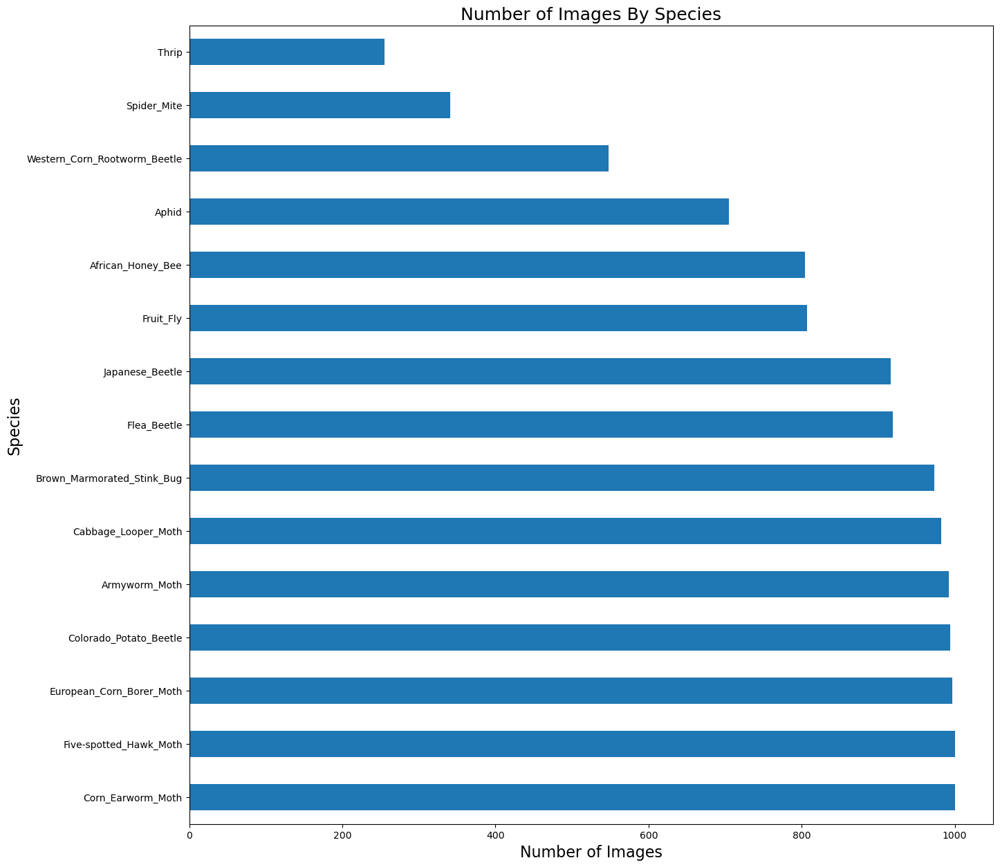

In [68]:
# Find the number of images for each insect species in the data set
data.Labels.value_counts().plot.barh(figsize = (15,15));
plt.title('Number of Images By Species', fontsize = 18)
plt.xlabel('Number of Images', fontsize = 16)
plt.ylabel('Species', fontsize=16)
plt.show();

In [20]:
# View the image formats in the data set
filetype_counts = data.Filepaths.str.extract(r'\.(\w+)$')[0].value_counts()
print(filetype_counts)

0
jpg     12210
png        10
jpeg        8
JPG         3
gif         2
Name: count, dtype: int64


The most common filetype used is jpg (noting that jpg, JPG, and jpeg are all equivalent). The remaining images need to be converted to match. 

In [21]:
# Creating a function to convert images to .jpg format
def convert_to_jpg(data):
    try:
        for filepath in data.Filepaths:
            curr_path = os.path.splitext(filepath)
            if curr_path[1] == '.jpg' or curr_path[1] == '.jpeg' or curr_path[1] == '.JPG':
                continue
            image = Image.open(filepath)
            image = image.convert('RGB') # Necessary to handle the GIFs in the data
            # Splits the filepath into the directory portion and the extension portion,returns just the directory portion, and adds the .jpg extension
            jpg_filepath = curr_path[0] + '.jpg'
            image.save(jpg_filepath)
            
            # Update the filepath in the data frame
            data.Filepaths.replace({filepath: jpg_filepath}, inplace=True)
    except Exception as e:
        print(f'Error converting {filepath}: {e}')
        

In [22]:
# Converting all pictures to .jpg
convert_to_jpg(data)

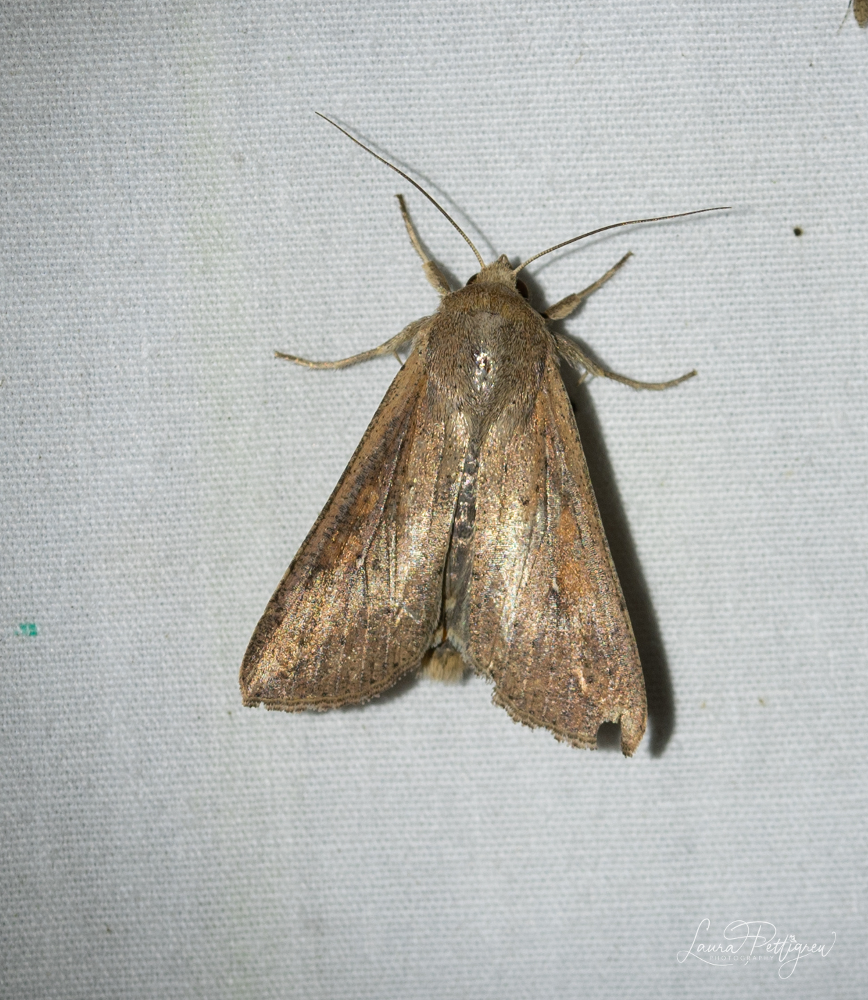

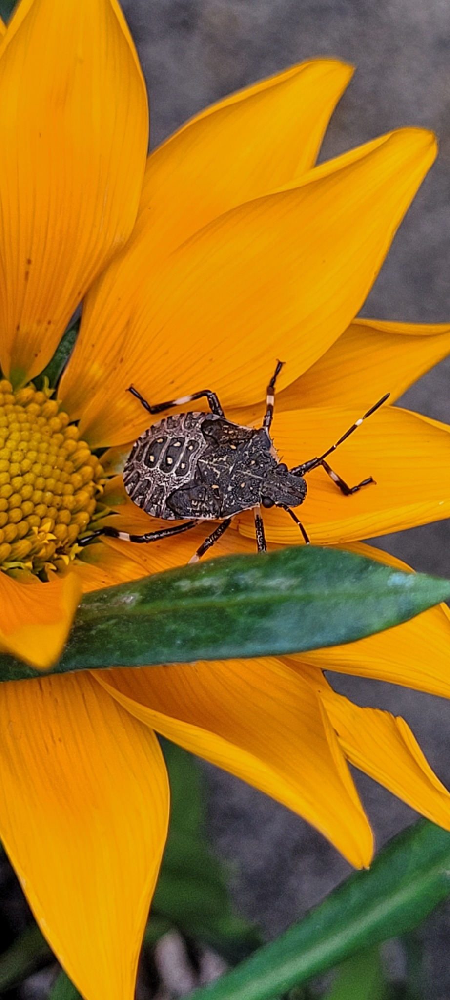

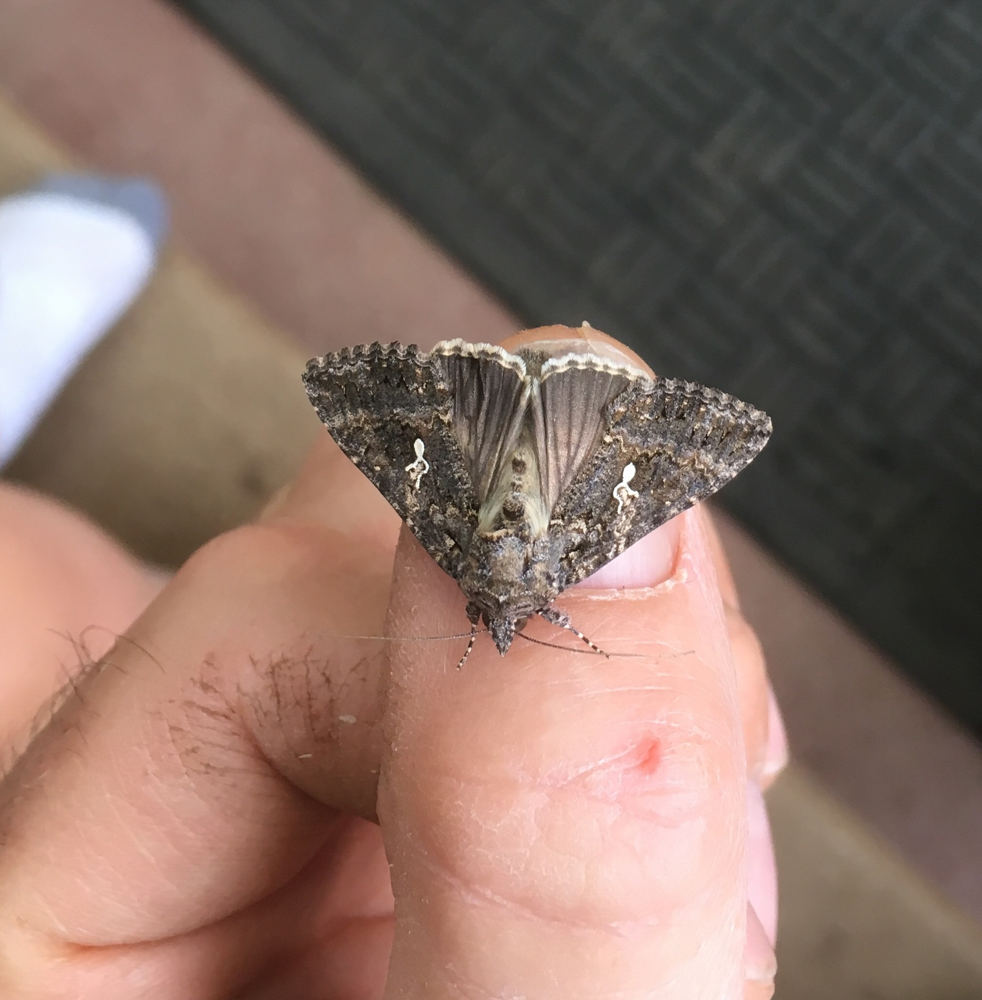

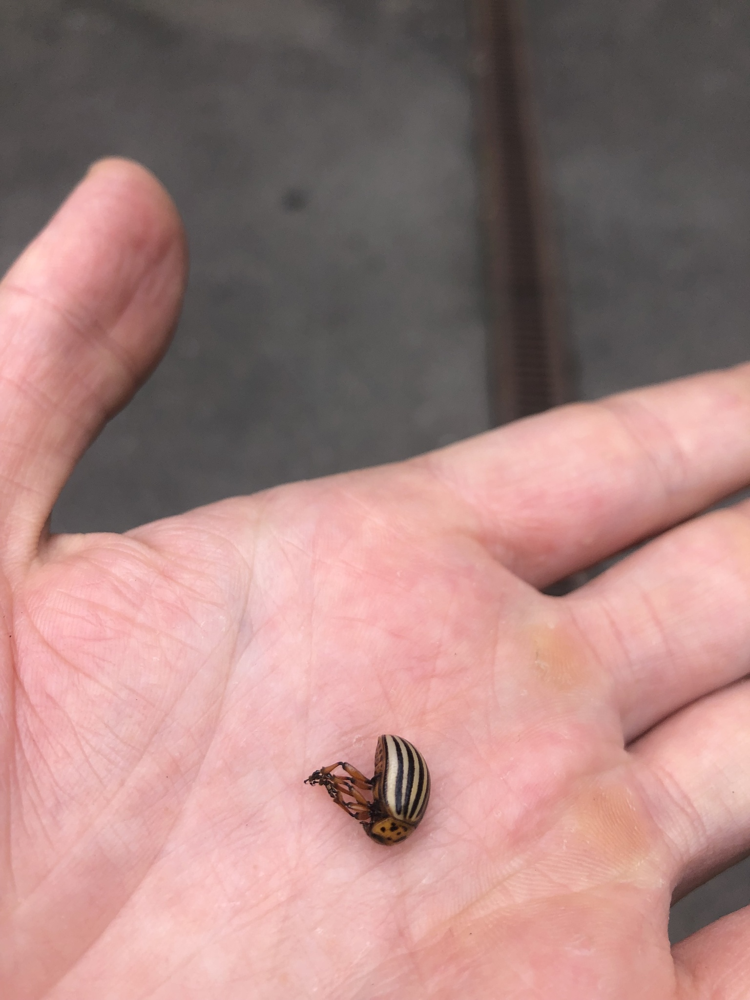

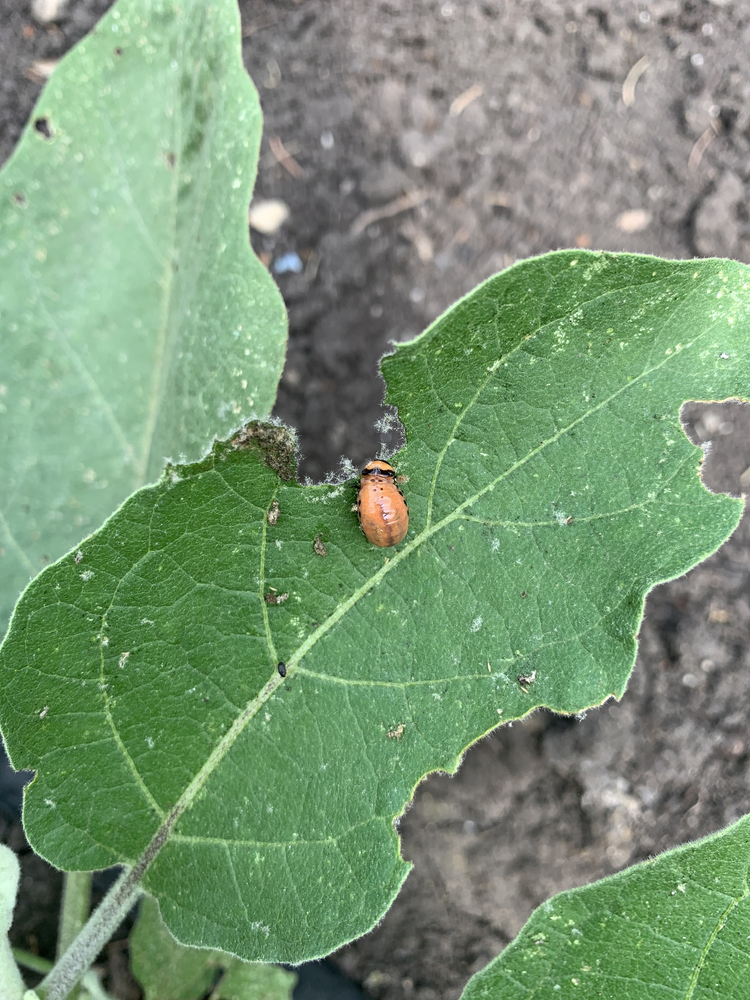

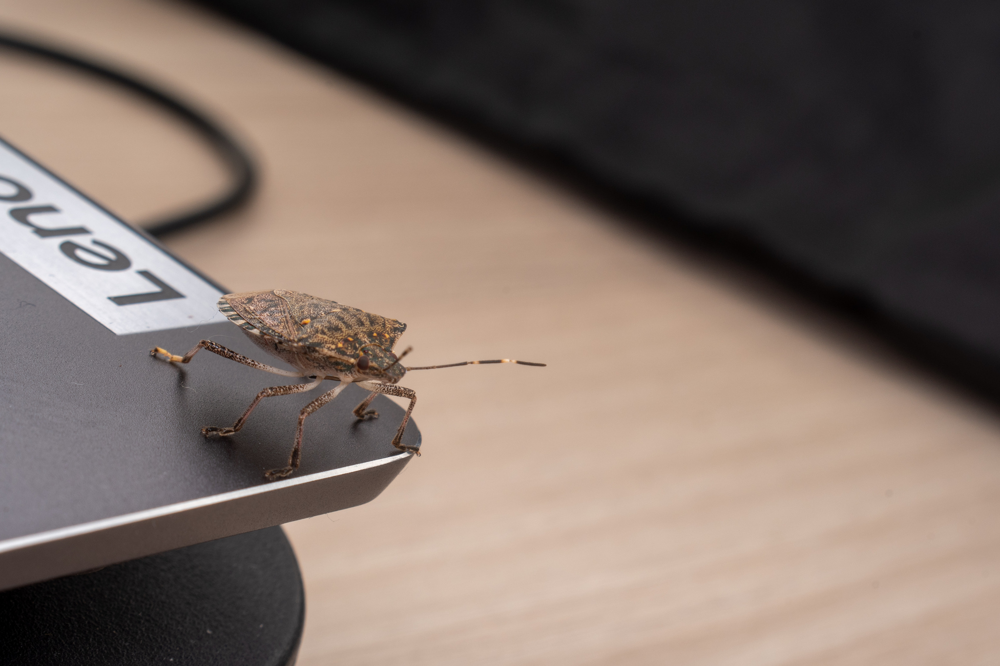

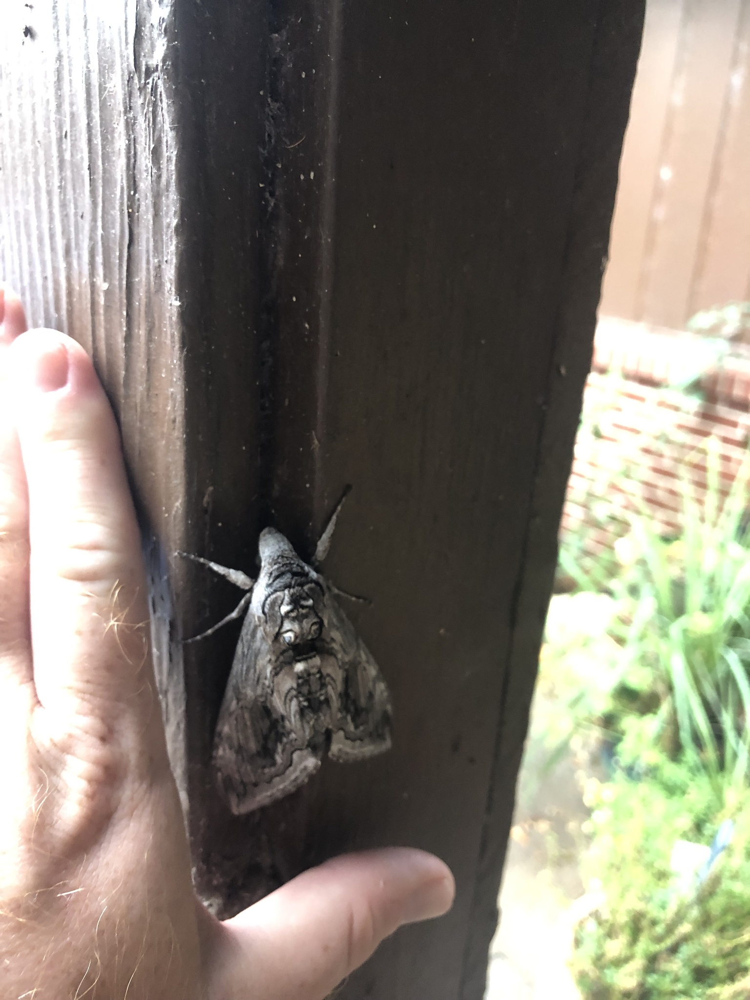

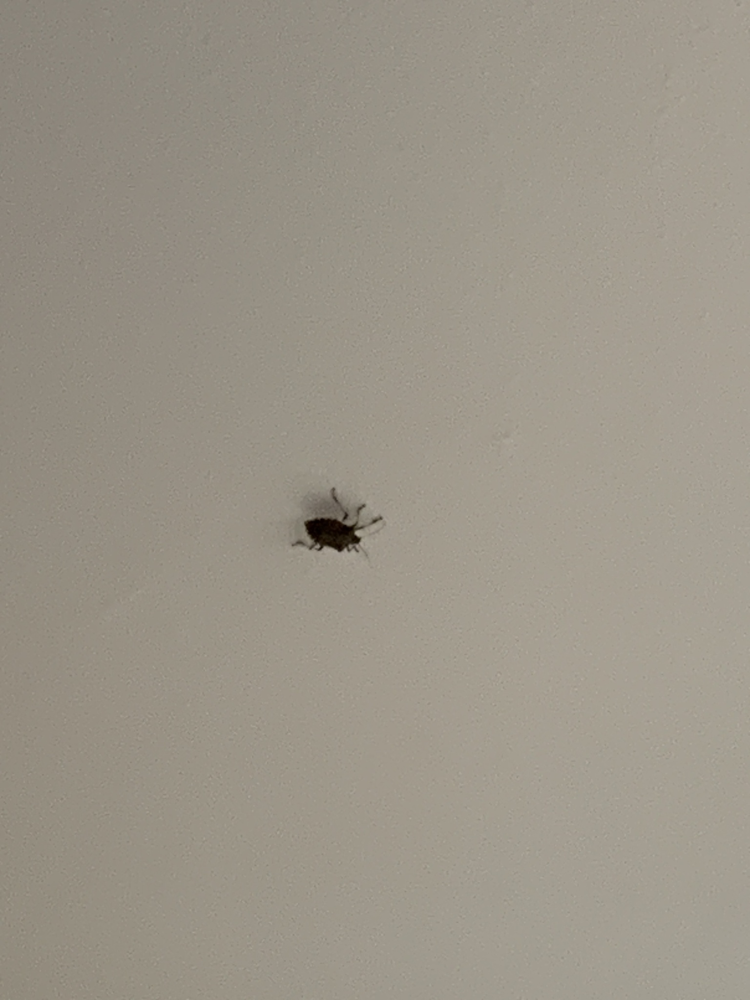

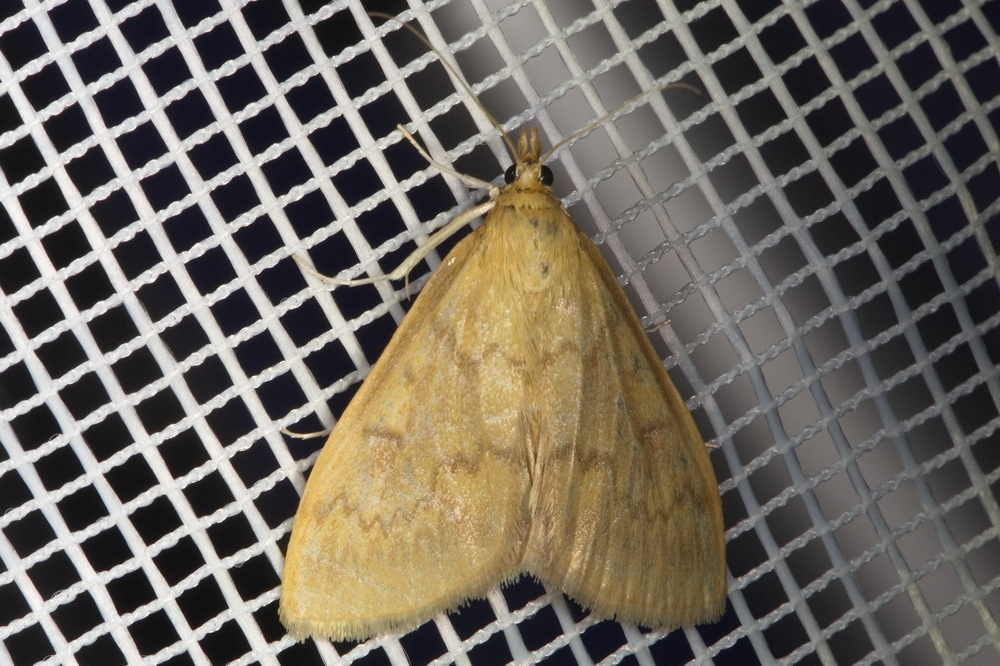

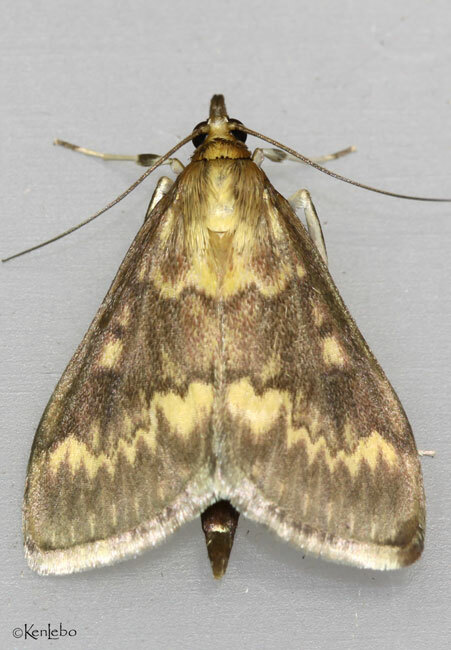

In [61]:
# View a random sample of images from the dataset
sample = random.sample(filepaths, 10)
for filepath in sample:
    display(IPImage(filepath))

We will now create a Principal Component Analysis (PCA) graph. A PCA graph is a way of transforming high dimensional features into a lower visual space in order to visualize feature similarity between classes. This will help to identify overlap in class features and view potential sources of misidentification. To reduce the amount of time and clutter it takes to create the graph, we will take a random sample of 1223 (10% of the dataset) images from the data set. 

In [2]:
data = pd.read_csv('filepaths_and_labels.csv')
data.head()

,Unnamed: 0,Filepaths,Labels
0,0,preprocessed_images\African_Honey_Bee\10010691...,African_Honey_Bee
1,1,preprocessed_images\African_Honey_Bee\10010715...,African_Honey_Bee
2,2,preprocessed_images\African_Honey_Bee\10077168...,African_Honey_Bee
3,3,preprocessed_images\African_Honey_Bee\10078030...,African_Honey_Bee
4,4,preprocessed_images\African_Honey_Bee\10103661...,African_Honey_Bee


In [9]:
# Set the seed so that the same images are selected each time this cell is run.
np.random.seed(8)

sample = data.sample(1223)

# PCA graphs require that all of the images be the same size. Since the models use 224x224 images, that is the size we shall choose.
filepaths = sample.Filepaths.tolist()
labels = sample.Labels.tolist()

target_size = (224, 224)  # Adjust as needed
num_images = len(filepaths)  # Number of images you have
num_components = 3  # Number of PCA components for visualization (e.g., 3 for a 3D scatterplot)

In [10]:
%matplotlib notebook

Note: Running the cell below takes a significant amout of memory and time. 

In [12]:
# Initialize empty array to store the preprocessed images
X = np.empty((num_images, target_size[0], target_size[1], 3), dtype=np.float32)  # Use 3 channels for color images

# Initialize a StandardScaler for normalization
scaler = StandardScaler()

# Loop through each image, preprocess, and normalize
for i, filepath in enumerate(filepaths):
    # Load the image
    original_image = io.imread(filepath)
    
    # Resize the image to the target size
    resized_image = transform.resize(original_image, target_size)
    
    # Normalize the resized image
    resized_image = scaler.fit_transform(resized_image.reshape(-1, 3)).reshape(target_size[0], target_size[1], 3)
    
    # Store the preprocessed color image
    X[i] = resized_image  # Store the preprocessed color image
    print(f'Prepping image {i}')

Prepping image 0
Prepping image 1
Prepping image 2
Prepping image 3
Prepping image 4
Prepping image 5
Prepping image 6
Prepping image 7
Prepping image 8
Prepping image 9
Prepping image 10
Prepping image 11
Prepping image 12
Prepping image 13
Prepping image 14
Prepping image 15
Prepping image 16
Prepping image 17
Prepping image 18
Prepping image 19
Prepping image 20
Prepping image 21
Prepping image 22
Prepping image 23
Prepping image 24
Prepping image 25
Prepping image 26
Prepping image 27
Prepping image 28
Prepping image 29
Prepping image 30
Prepping image 31
Prepping image 32
Prepping image 33
Prepping image 34
Prepping image 35
Prepping image 36
Prepping image 37
Prepping image 38
Prepping image 39
Prepping image 40
Prepping image 41
Prepping image 42
Prepping image 43
Prepping image 44
Prepping image 45
Prepping image 46
Prepping image 47
Prepping image 48
Prepping image 49
Prepping image 50
Prepping image 51
Prepping image 52
Prepping image 53
Prepping image 54
Prepping image 55
Pr

Prepping image 437
Prepping image 438
Prepping image 439
Prepping image 440
Prepping image 441
Prepping image 442
Prepping image 443
Prepping image 444
Prepping image 445
Prepping image 446
Prepping image 447
Prepping image 448
Prepping image 449
Prepping image 450
Prepping image 451
Prepping image 452
Prepping image 453
Prepping image 454
Prepping image 455
Prepping image 456
Prepping image 457
Prepping image 458
Prepping image 459
Prepping image 460
Prepping image 461
Prepping image 462
Prepping image 463
Prepping image 464
Prepping image 465
Prepping image 466
Prepping image 467
Prepping image 468
Prepping image 469
Prepping image 470
Prepping image 471
Prepping image 472
Prepping image 473
Prepping image 474
Prepping image 475
Prepping image 476
Prepping image 477
Prepping image 478
Prepping image 479
Prepping image 480
Prepping image 481
Prepping image 482
Prepping image 483
Prepping image 484
Prepping image 485
Prepping image 486
Prepping image 487
Prepping image 488
Prepping ima

Prepping image 869
Prepping image 870
Prepping image 871
Prepping image 872
Prepping image 873
Prepping image 874
Prepping image 875
Prepping image 876
Prepping image 877
Prepping image 878
Prepping image 879
Prepping image 880
Prepping image 881
Prepping image 882
Prepping image 883
Prepping image 884
Prepping image 885
Prepping image 886
Prepping image 887
Prepping image 888
Prepping image 889
Prepping image 890
Prepping image 891
Prepping image 892
Prepping image 893
Prepping image 894
Prepping image 895
Prepping image 896
Prepping image 897
Prepping image 898
Prepping image 899
Prepping image 900
Prepping image 901
Prepping image 902
Prepping image 903
Prepping image 904
Prepping image 905
Prepping image 906
Prepping image 907
Prepping image 908
Prepping image 909
Prepping image 910
Prepping image 911
Prepping image 912
Prepping image 913
Prepping image 914
Prepping image 915
Prepping image 916
Prepping image 917
Prepping image 918
Prepping image 919
Prepping image 920
Prepping ima

In [13]:
# Normalize the entire dataset
X_flat = X.reshape(num_images, -1)


# Create a PCA instance
pca = PCA(n_components=num_components)

# Perform PCA on the preprocessed images
X_pca = pca.fit_transform(X_flat)

In [14]:
labels = sample.Labels
unique_labels = labels.unique()

In [15]:
# Check the indexes for the label -- Since the images are randomly sampled, they will likely be out of order
labels

7328         European_Corn_Borer_Moth
11341                     Spider_Mite
7566           Five-spotted_Hawk_Moth
6882         European_Corn_Borer_Moth
3753              Cabbage_Looper_Moth
                     ...             
6474         European_Corn_Borer_Moth
8981                      Flea_Beetle
4945           Colorado_Potato_Beetle
1763                    Armyworm_Moth
12054    Western_Corn_Rootworm_Beetle
Name: Labels, Length: 1223, dtype: object

In [16]:
# Reset the index for the samples - This will be used to compare the labels for categorization in the PCA graph
labels.reset_index(drop=True, inplace=True)

In [17]:
labels

0           European_Corn_Borer_Moth
1                        Spider_Mite
2             Five-spotted_Hawk_Moth
3           European_Corn_Borer_Moth
4                Cabbage_Looper_Moth
                    ...             
1218        European_Corn_Borer_Moth
1219                     Flea_Beetle
1220          Colorado_Potato_Beetle
1221                   Armyworm_Moth
1222    Western_Corn_Rootworm_Beetle
Name: Labels, Length: 1223, dtype: object

In [18]:
# Categorize the images by label for the graph
class_indices = [[1]]*len(unique_labels)
for i, label in enumerate(unique_labels):
    class_indices[i] = labels.loc[labels==label].index

<IPython.core.display.Javascript object>


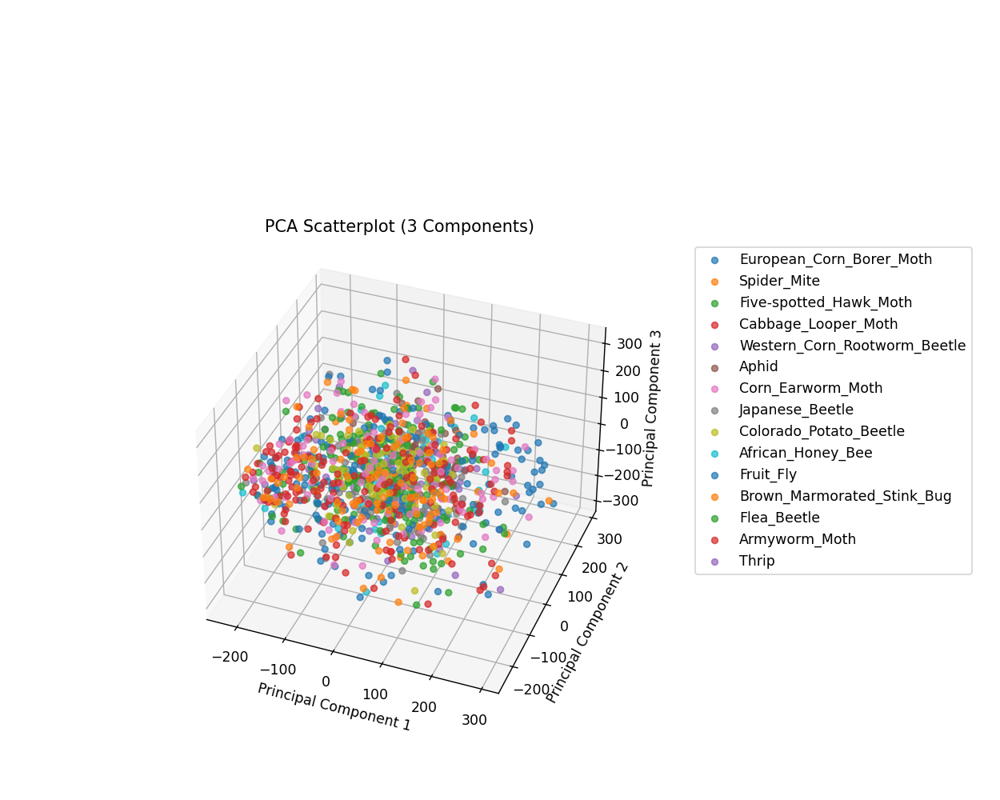

In [38]:
# Create a scatterplot to visualize the PCA results
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d', position=[.1,.1,.6,.6])
for i in range(len(class_indices)):
    ax.scatter(
        X_pca[class_indices[i], 0],
        X_pca[class_indices[i], 1],
        X_pca[class_indices[i], 2],
        label=unique_labels[i],
        alpha=.7,  # Adjust alpha for transparency
        
    )

plt.title(f'PCA Scatterplot ({num_components} Components)')
plt.xlabel(f'Principal Component 1')
plt.ylabel(f'Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.legend(loc='upper left', bbox_to_anchor=(1.1, 1))
plt.grid(True)
plt.show()


### 4.2 Image Preprocessing

The images of the dataset are of varying size and quality, and show varying numbers of insects per image. At the very least, all images will need to be resized prior to being used for the model.

In this section we will:

* Convert all labels to boolean arrays
* Shuffle the data and divide it into train, validation, and test sets. 
* Construct a function to resize the images as needed for the transfer learning models.
    * We will compare three TensorFlow Hub models that all expect images to be 224x224. The models themselves are discussed in section 5
* Construct a function to split the pictures into batches for training the models. 



In [73]:
data.to_csv('filepaths_and_labels.csv')

In [2]:
data = pd.read_csv('filepaths_and_labels.csv')

In [3]:
# The labels need to be converted into boolean arrays in order to be processed by the training model. 
# First we need a list of the labels as a numPy array
labels = data.Labels.to_numpy()

# Then we need another numPy array for unique lables (ie, for the classes)
unique_labels = np.unique(labels)

# Lastly we turn each label into a boolean array
boolean_labels=[label == unique_labels for label in labels]

In [5]:
unique_labels

array(['African_Honey_Bee', 'Aphid', 'Armyworm_Moth',
       'Brown_Marmorated_Stink_Bug', 'Cabbage_Looper_Moth',
       'Colorado_Potato_Beetle', 'Corn_Earworm_Moth',
       'European_Corn_Borer_Moth', 'Five-spotted_Hawk_Moth',
       'Flea_Beetle', 'Fruit_Fly', 'Japanese_Beetle', 'Spider_Mite',
       'Thrip', 'Western_Corn_Rootworm_Beetle'], dtype=object)

In [5]:
boolean_labels[0]

array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False])

Split the data into training and validation sets, limiting the selection to 2000 random images for the initial models

In [4]:
# Setup the main variables
X = data.Filepaths
y = boolean_labels

# Invoke train_test_split() once to split into the training set and the validation set
X_train, X_val, y_train, y_val = train_test_split(X[:2000], 
                                                  y[:2000], 
                                                  test_size = 0.15,
                                                  random_state = 8,
                                                  shuffle = True)

len(X_train), len(y_train), len(X_val), len(y_val)

(1700, 1700, 300, 300)

To take advantage of transfer learning, the images being passed to the model must be changed into tensors and resized to 224x224.

In [4]:
# Creating a function for the transformation:
def process_image(image_path):
    """
    Takes a filepath to an image and converts the image into a tensor of the appropriate shape.
    """
    
    # Read the image file:
    image = tf.io.read_file(image_path)
    # Convert the jpg image into a tensor with 3 color channels
    image = tf.image.decode_jpeg(image, channels=3)
    # Normalize the color channels
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize the image
    image = tf.image.resize(image, size = [224,224])
    
    return image

Models take training and validation data as tuples of an image (as a tensor) and its associated label (image, label). 

In [5]:
# Create a function to return the input tuple
def get_image_label(image_path, label):
    """
    Takes the filepath for an image and the associated label, processes the image, and returns a tuple (image, label)
    """
    
    image = process_image(image_path)
    return image, label

In order to avoid overloading memory, images for the model are loaded in batches. Tensorflow has a a handful of methods useful for creating batches that can be combined into a function. General convention is to use batch sizes of 32 images. 

In [68]:
# Create a function to divide the data into batches

# Inputs are the image filepath data set, the corresponding labels (if any -- the test set does not need labels),
# and a boolean to denote if the input is a validation set or a test image (ie, an image submitted to the model for real classification). 
def create_data_batches(X, y=None, val_data = False, test_image = False):
    """
    Creates batches out of image/label pairs. If the data is training data, it will shuffle the data. 
    """
    
    # If the data is a test image, we will not have a label:
    if test_image:
        print('Converting image to batch')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Creates a dataset out of slices of the given tensors using only the filepaths
        data_batch = data.map(process_image).batch(32) # Applies the process_image() function to the sliced data in batches
        return data_batch
    
    # If the data is a validation or test set, we don't need to shuffle it
    elif val_data:
        print('Creating validation/test batches...')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                    tf.constant(y))) #labels
        data_batch = data.map(get_image_label).batch(32) # applying the get_image_labels() function this time because we have labels
        return data_batch
    
    # If the data is training data
    else:
        print('Creating training batches...')
        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                   tf.constant(y))) #labels
        # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images.
        data = data.shuffle(buffer_size = len(X))

        # Create image,data tuples and preprocess the image
        data=data.map(get_image_label)

        # Turn the data into batches
        data_batch = data.batch(32)
    return data_batch
        

In [7]:
# Create the training and validation batches
train_data = create_data_batches(X_train, y=y_train)
val_data = create_data_batches(X_val, y_val, val_data=True)

NameError: name 'X_train' is not defined

In [11]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 15), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 15), dtype=tf.bool, name=None)))

## 5. Modelling

Building a transfer learning model requires 3 things
* The input shape for the model (the images in tensor form)
* The output shape for the model (the classification labels in tensor form)
* The tensorflow hub model url

For this project, will we create a model using transfer learning from three different tensorflow hub models, tune each model separately, test them, and compare the results to pick the model with the highest overall accuracy. The three models being used are:
1. https://tfhub.dev/google/imagenet/inception_v3/classification/5: A general purpose classification model primarily used for models that must extract varying sized features from an image. 
2. https://tfhub.dev/google/imagenet/resnet_v2_50/classification/5: A popular classification model trained off of imagenet data, generally suited for PC use. 
3. https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5: Another popular classification model trained off of imagenet data, optimized for mobile use. 

In [8]:
# Set up the input and output shape for the model
INPUT_SHAPE = [None, 224, 224, 3]
OUTPUT_SHAPE = len(unique_labels)

Now to create a function for creating a model using a given transfer learning model and Keras, a tensorflow modeling tool. This will create the base models that we will use for hyperparameter tuning and comparison.

In [10]:
# Create a modelling function
def create_model(url, input_shape = INPUT_SHAPE, output_shape=OUTPUT_SHAPE):
    """
    Uses an input shape, output shape, and URL for a tensorflow hub transfer learning model to create a sequential image classifier using keras
    """
    
    print('Building model with:', url)

    # Setup the model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(url), # Layer 1, the input layer
        tf.keras.layers.Dense(units=output_shape,
                              activation='softmax') # Layer 2, the output layer
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=['accuracy']
        )

    # Build the model
    model.build(input_shape)

    return model

In [30]:
inception_V3_model = create_model('https://tfhub.dev/google/imagenet/inception_v3/classification/5')
resnet_50_model = create_model('https://tfhub.dev/google/imagenet/resnet_v2_50/classification/5')
mobile_net_V3_model = create_model('https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5')

Building model with: https://tfhub.dev/google/imagenet/inception_v3/classification/5
Building model with: https://tfhub.dev/google/imagenet/resnet_v2_50/classification/5
Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5


Now we will create a pair of callback functions to help track the models progress and prevent the model from training for too long or allow it to stop early if its accuracy converges.

The tensorboard callback sets up a logging system for the model that will save logs created during the model fit process to a directory. It will also allow the use of the %tensorboard magic function which can create visualizations of the model's performance. 

In [11]:
# Load the tensorboard notebook extension
%load_ext tensorboard

In [12]:
# Create a construction function for the tensorboard callback

def create_tb_callback(inception = False, resnet=False):
    if inception:
        subfolder = 'inception'
    elif resnet:
        subfolder = 'resnet'
    else:
        subfolder = 'mobile_net'
    
    # The logs get created and stamped with the current datetime every time we run an experiment
    logdir = os.path.join('/Users/cdunb/Conda Projects/School-Project/model_logs/'+ subfolder,datetime.datetime.now().strftime('%Y%m%d-%H%M%S')) 
    
    return tf.keras.callbacks.TensorBoard(logdir)
    

The early stopping callback prevents the model from overfitting by stopping training if the accuracy of the model stops improving. 

In [13]:
# Create early stopping callback
# In this case, stop criteria are if the accuracy on the validation data set stops improving for 3 epochs
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                 patience = 3)

In [14]:
# Build a model training function

def train_model(model, num_epochs, training_data, val_data, inception = False, resnet=False):
    """
    Trains the given model on the given data and returns a trained model.
    """
    
    # Create a new tensorboard callback every time we train a model
    if inception:
        tensorboard = create_tb_callback(inception=True)
        print('tensorboard callback created')
    elif resnet:
        tensorboard = create_tb_callback(resnet=True)
        print('tensorboard callback created')
    else:
        tensorboard = create_tb_callback()
        print('tensorboard callback created')
        
    # Fit the model to the data, passing it the created callbacks
    model.fit(x=training_data,
             epochs=num_epochs,
             validation_data = val_data,
             validation_freq=1,
             callbacks=[tensorboard,early_stopping])
    
    return model

In [31]:
inception_V3_model = train_model(inception_V3_model, 100, train_data, val_data, inception=True)

tensorboard callback created
Epoch 1/100
54/54 [==============================] - 20s 293ms/step - loss: 0.8275 - accuracy: 0.7659 - val_loss: 0.3137 - val_accuracy: 0.8967
Epoch 2/100
54/54 [==============================] - 15s 279ms/step - loss: 0.2701 - accuracy: 0.9159 - val_loss: 0.2451 - val_accuracy: 0.9033
Epoch 3/100
54/54 [==============================] - 15s 280ms/step - loss: 0.2109 - accuracy: 0.9265 - val_loss: 0.2739 - val_accuracy: 0.9067
Epoch 4/100
54/54 [==============================] - 15s 278ms/step - loss: 0.1543 - accuracy: 0.9429 - val_loss: 0.2170 - val_accuracy: 0.9200
Epoch 5/100
54/54 [==============================] - 15s 278ms/step - loss: 0.1300 - accuracy: 0.9559 - val_loss: 0.2107 - val_accuracy: 0.9300
Epoch 6/100
54/54 [==============================] - 15s 278ms/step - loss: 0.1182 - accuracy: 0.9559 - val_loss: 0.2389 - val_accuracy: 0.9267
Epoch 7/100
54/54 [==============================] - 15s 279ms/step - loss: 0.0982 - accuracy: 0.9641 - val

In [32]:
resnet_50_model = train_model(resnet_50_model, 100, train_data, val_data, resnet=True)

tensorboard callback created
Epoch 1/100
54/54 [==============================] - 18s 280ms/step - loss: 0.7812 - accuracy: 0.7771 - val_loss: 0.3135 - val_accuracy: 0.8900
Epoch 2/100
54/54 [==============================] - 15s 278ms/step - loss: 0.2576 - accuracy: 0.9147 - val_loss: 0.2438 - val_accuracy: 0.9267
Epoch 3/100
54/54 [==============================] - 15s 279ms/step - loss: 0.1840 - accuracy: 0.9376 - val_loss: 0.2289 - val_accuracy: 0.9200
Epoch 4/100
54/54 [==============================] - 15s 278ms/step - loss: 0.1674 - accuracy: 0.9394 - val_loss: 0.2034 - val_accuracy: 0.9233
Epoch 5/100
54/54 [==============================] - 15s 277ms/step - loss: 0.1284 - accuracy: 0.9547 - val_loss: 0.2125 - val_accuracy: 0.9100


In [33]:
 mobile_net_V3_model= train_model(mobile_net_V3_model, 100, train_data, val_data)

tensorboard callback created
Epoch 1/100
54/54 [==============================] - 19s 276ms/step - loss: 0.8495 - accuracy: 0.7371 - val_loss: 0.2787 - val_accuracy: 0.9167
Epoch 2/100
54/54 [==============================] - 15s 277ms/step - loss: 0.1968 - accuracy: 0.9335 - val_loss: 0.2321 - val_accuracy: 0.9367
Epoch 3/100
54/54 [==============================] - 15s 277ms/step - loss: 0.1346 - accuracy: 0.9576 - val_loss: 0.2170 - val_accuracy: 0.9467
Epoch 4/100
54/54 [==============================] - 15s 277ms/step - loss: 0.1062 - accuracy: 0.9629 - val_loss: 0.2025 - val_accuracy: 0.9433
Epoch 5/100
54/54 [==============================] - 15s 278ms/step - loss: 0.0841 - accuracy: 0.9765 - val_loss: 0.1942 - val_accuracy: 0.9500
Epoch 6/100
54/54 [==============================] - 15s 277ms/step - loss: 0.0708 - accuracy: 0.9824 - val_loss: 0.1920 - val_accuracy: 0.9500
Epoch 7/100
54/54 [==============================] - 15s 277ms/step - loss: 0.0591 - accuracy: 0.9853 - val

In [47]:
# Saving the base models

inception_V3_model.save('/Users/cdunb/Conda Projects/School-Project/models/inception/inception_model_1.h5')
resnet_50_model.save('/Users/cdunb/Conda Projects/School-Project/models/resnet/resnet_model_1.h5')
mobile_net_V3_model.save('/Users/cdunb/Conda Projects/School-Project/models/mobile_net/mobile_net_model_1.h5')

In [3]:
inception_V3_model = tf.keras.models.load_model('/Users/cdunb/Conda Projects/School-Project/models/inception/inception_model_1.h5',
                                               custom_objects={'KerasLayer':hub.KerasLayer})
resnet_50_model=tf.keras.models.load_model('/Users/cdunb/Conda Projects/School-Project/models/resnet/resnet_model_1.h5',
                                          custom_objects={'KerasLayer':hub.KerasLayer})
mobile_net_V3_model = tf.keras.models.load_model('/Users/cdunb/Conda Projects/School-Project/models/mobile_net/mobile_net_model_1.h5',
                                                custom_objects={'KerasLayer':hub.KerasLayer})

In [21]:
%reload_ext tensorboard

In [4]:
%tensorboard --logdir /Users/cdunb/Conda\ Projects/School-Project/model_logs

Looking at the base model data, mobile net appears to be performing the best with a 96% accuracy on the validation set. 

## 6. Experimentation

Now that we have base models for each transfer learning models, we will adjust the hyperparameters for each model to see if we can improve their performance. The hyperparameters we will consider adjusting are the number of layers, and the learning rate of the optimizer

We will start by modifying the create_model function to add additional layers using a relu activation function between the input and output layers.
* A single additional layer with 128 units
* Two additional layers, with 128, 64 units
* Three additional layers with 128, 64, and 32 units

Using the best model from above, we will then attempt to tune the learning rate of the optimizer. The default learning rate of the Adam optimizer is .001. We will run a model using values of:
* .0005
* .002
* .005
* .01

Once this has been done for all of the models, we will use the best parameter combination to build the final models. 

### 6.1 Inception Model Tuning

In [49]:
# Modifying the create model function to add layers
def create_model(url, input_shape = INPUT_SHAPE, output_shape=OUTPUT_SHAPE, layers = 2, optimize=.001):
    """
    Uses an input shape, output shape, and URL for a tensorflow hub transfer learning model to create a sequential image classifier using keras
    """
    
    print('Building model with:', url)

    # Setup to allow for a variable number of model layers:
    
    if layers == 5:
        model = tf.keras.Sequential([
            hub.KerasLayer(url), # Layer 1, the input layer
            tf.keras.layers.Dense(units=128, activation='relu'),
            tf.keras.layers.Dense(units=64, activation='relu'),
            tf.keras.layers.Dense(units=32, activation='relu'),
            tf.keras.layers.Dense(units=output_shape,
                                  activation='softmax') # Layer 2, the output layer
        ])
    elif layers == 4:
        model = tf.keras.Sequential([
            hub.KerasLayer(url), # Layer 1, the input layer
            tf.keras.layers.Dense(units=128, activation='relu'),
            tf.keras.layers.Dense(units=64, activation='relu'),
            tf.keras.layers.Dense(units=output_shape,
                                  activation='softmax')
        ])
    elif layers == 3:
        model = tf.keras.Sequential([
            hub.KerasLayer(url), # Layer 1, the input layer
            tf.keras.layers.Dense(units=128, activation='relu'),
            tf.keras.layers.Dense(units=output_shape,
                                  activation='softmax')
        ])
    else:
        model = tf.keras.Sequential([
            hub.KerasLayer(url), # Layer 1, the input layer
            tf.keras.layers.Dense(units=output_shape,
                                  activation='softmax')
        ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(learning_rate = optimize),
        metrics=['accuracy']
        )

    # Build the model
    model.build(input_shape)

    return model

In [16]:
layer_trials = [3, 4, 5]

In [20]:
for i in range(len(layer_trials)):
    inception_V3_model = create_model('https://tfhub.dev/google/imagenet/inception_v3/classification/5', layers = layer_trials[i])
    inception_V3_model = train_model(inception_V3_model, 100, train_data, val_data, inception=True)
    inception_V3_model.save(f'/Users/cdunb/Conda Projects/School-Project/models/inception/inception_model_{i+2}.h5')

Building model with: https://tfhub.dev/google/imagenet/inception_v3/classification/5
tensorboard callback created
Epoch 1/100
54/54 [==============================] - 26s 290ms/step - loss: 0.7688 - accuracy: 0.7812 - val_loss: 0.2463 - val_accuracy: 0.9100
Epoch 2/100
54/54 [==============================] - 15s 280ms/step - loss: 0.1831 - accuracy: 0.9394 - val_loss: 0.2328 - val_accuracy: 0.9133
Epoch 3/100
54/54 [==============================] - 15s 281ms/step - loss: 0.1264 - accuracy: 0.9553 - val_loss: 0.2039 - val_accuracy: 0.9367
Epoch 4/100
54/54 [==============================] - 15s 281ms/step - loss: 0.1030 - accuracy: 0.9676 - val_loss: 0.1736 - val_accuracy: 0.9333
Epoch 5/100
54/54 [==============================] - 15s 281ms/step - loss: 0.0759 - accuracy: 0.9776 - val_loss: 0.1747 - val_accuracy: 0.9533
Epoch 6/100
54/54 [==============================] - 15s 283ms/step - loss: 0.0518 - accuracy: 0.9894 - val_loss: 0.1799 - val_accuracy: 0.9533
Epoch 7/100
54/54 [===

In [16]:
%tensorboard --logdir /Users/cdunb/Conda\ Projects/School-Project/model_logs/resnet

Of the experiments performed, the best performance for the inception model appeared to be with one additional relu layer, resulting in an accuracy approx 2.5% higher on the validation data set. 

Now to adjust the learning rate:

In [17]:
optimizer_trials = [.0005, .002, .005, .01]

In [19]:
for i in range(len(optimizer_trials)):
    inception_V3_model = create_model('https://tfhub.dev/google/imagenet/inception_v3/classification/5', layers = layer_trials[0], optimize = optimizer_trials[i])
    inception_V3_model = train_model(inception_V3_model, 100, train_data, val_data, inception=True)
    inception_V3_model.save(f'/Users/cdunb/Conda Projects/School-Project/models/inception/inception_model_{i+5}.h5')

Building model with: https://tfhub.dev/google/imagenet/inception_v3/classification/5
tensorboard callback created
Epoch 1/100
54/54 [==============================] - 23s 290ms/step - loss: 0.8750 - accuracy: 0.7559 - val_loss: 0.3060 - val_accuracy: 0.8967
Epoch 2/100
54/54 [==============================] - 15s 282ms/step - loss: 0.2506 - accuracy: 0.9112 - val_loss: 0.2583 - val_accuracy: 0.9100
Epoch 3/100
54/54 [==============================] - 16s 288ms/step - loss: 0.1710 - accuracy: 0.9441 - val_loss: 0.2417 - val_accuracy: 0.9200
Epoch 4/100
54/54 [==============================] - 15s 285ms/step - loss: 0.1296 - accuracy: 0.9647 - val_loss: 0.2281 - val_accuracy: 0.9167
Epoch 5/100
54/54 [==============================] - 16s 285ms/step - loss: 0.0990 - accuracy: 0.9735 - val_loss: 0.2331 - val_accuracy: 0.9367
Epoch 6/100
54/54 [==============================] - 15s 285ms/step - loss: 0.0788 - accuracy: 0.9806 - val_loss: 0.2271 - val_accuracy: 0.9167
Epoch 7/100
54/54 [===

In [22]:
%tensorboard --logdir /Users/cdunb/Conda\ Projects/School-Project/resnet

Reusing TensorBoard on port 6006 (pid 7348), started 0:00:23 ago. (Use '!kill 7348' to kill it.)

Adjusting the learning rate did not result in any increase in performance, with a rate of .001 (the default) yielding the best results. So, the best hyper parameter combination for the inception based model is 3 layers with a learning rate of .001, saved as model 2.  

## 6.2 Resnet Model Tuning

Performing the same set of steps on the Resnet based model

In [20]:
for i in range(len(layer_trials)):
    resnet_50_model = create_model('https://tfhub.dev/google/imagenet/resnet_v2_50/classification/5', layers = layer_trials[i])
    resnet_50_model = train_model(resnet_50_model, 100, train_data, val_data, resnet=True)
    resnet_50_model.save(f'/Users/cdunb/Conda Projects/School-Project/models/resnet/resnet_model_{i+2}.h5')

Building model with: https://tfhub.dev/google/imagenet/resnet_v2_50/classification/5
tensorboard callback created
Epoch 1/100
54/54 [==============================] - 18s 282ms/step - loss: 0.8796 - accuracy: 0.7553 - val_loss: 0.2607 - val_accuracy: 0.9133
Epoch 2/100
54/54 [==============================] - 15s 283ms/step - loss: 0.2132 - accuracy: 0.9218 - val_loss: 0.2096 - val_accuracy: 0.9233
Epoch 3/100
54/54 [==============================] - 15s 281ms/step - loss: 0.1410 - accuracy: 0.9559 - val_loss: 0.1881 - val_accuracy: 0.9433
Epoch 4/100
54/54 [==============================] - 15s 282ms/step - loss: 0.1003 - accuracy: 0.9712 - val_loss: 0.1813 - val_accuracy: 0.9433
Epoch 5/100
54/54 [==============================] - 15s 283ms/step - loss: 0.0720 - accuracy: 0.9812 - val_loss: 0.1785 - val_accuracy: 0.9500
Epoch 6/100
54/54 [==============================] - 15s 286ms/step - loss: 0.0570 - accuracy: 0.9859 - val_loss: 0.1815 - val_accuracy: 0.9533
Epoch 7/100
54/54 [===

In [19]:
%tensorboard --logdir /Users/cdunb/Conda\ Projects/School-Project/model_logs

For the resnet based models, the best performance came from 4 total layers, with an accuracy 4% higher than the base model. 

In [20]:
resnet_50_model=tf.keras.models.load_model('/Users/cdunb/Conda Projects/School-Project/models/resnet/resnet_model_3.h5',
                                          custom_objects={'KerasLayer':hub.KerasLayer})

In [22]:
for i in range(len(optimizer_trials)):
    resnet_50_model = create_model('https://tfhub.dev/google/imagenet/resnet_v2_50/classification/5', layers = 4, optimize = optimizer_trials[i])
    resnet_50_model = train_model(resnet_50_model, 100, train_data, val_data, resnet=True)
    resnet_50_model.save(f'/Users/cdunb/Conda Projects/School-Project/models/resnet/resnet_model_{i+5}.h5')

Building model with: https://tfhub.dev/google/imagenet/resnet_v2_50/classification/5
tensorboard callback created
Epoch 1/100
54/54 [==============================] - 21s 278ms/step - loss: 0.9741 - accuracy: 0.7018 - val_loss: 0.3492 - val_accuracy: 0.8667
Epoch 2/100
54/54 [==============================] - 15s 280ms/step - loss: 0.2499 - accuracy: 0.9194 - val_loss: 0.2238 - val_accuracy: 0.9233
Epoch 3/100
54/54 [==============================] - 15s 284ms/step - loss: 0.1612 - accuracy: 0.9547 - val_loss: 0.1922 - val_accuracy: 0.9367
Epoch 4/100
54/54 [==============================] - 15s 280ms/step - loss: 0.1215 - accuracy: 0.9688 - val_loss: 0.1647 - val_accuracy: 0.9367
Epoch 5/100
54/54 [==============================] - 15s 282ms/step - loss: 0.0959 - accuracy: 0.9765 - val_loss: 0.1776 - val_accuracy: 0.9300
Epoch 6/100
54/54 [==============================] - 15s 281ms/step - loss: 0.0775 - accuracy: 0.9829 - val_loss: 0.1522 - val_accuracy: 0.9367
Building model with: h

In [19]:
%tensorboard --logdir /Users/cdunb/Conda\ Projects/School-Project/model_logs

Reusing TensorBoard on port 6006 (pid 6096), started 0:00:37 ago. (Use '!kill 6096' to kill it.)

For the resnet based model, the default learning rate was the most effective, making the parameters for model 3 the best parameter for Resnet

### 6.3 Mobile_net Model Tuning

In [22]:
for i in range(len(layer_trials)):
    mobile_net_V3_model = create_model('https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5', layers = layer_trials[i])
    mobile_net_V3_model= train_model(mobile_net_V3_model, 100, train_data, val_data)
    mobile_net_V3_model.save(f'/Users/cdunb/Conda Projects/School-Project/models/mobile_net/mobile_net_model_{i+2}.h5')

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
tensorboard callback created
Epoch 1/100
54/54 [==============================] - 19s 275ms/step - loss: 0.6010 - accuracy: 0.8247 - val_loss: 0.1737 - val_accuracy: 0.9433
Epoch 2/100
54/54 [==============================] - 15s 281ms/step - loss: 0.1150 - accuracy: 0.9688 - val_loss: 0.1284 - val_accuracy: 0.9567
Epoch 3/100
54/54 [==============================] - 15s 278ms/step - loss: 0.0581 - accuracy: 0.9841 - val_loss: 0.1274 - val_accuracy: 0.9567
Epoch 4/100
54/54 [==============================] - 15s 282ms/step - loss: 0.0324 - accuracy: 0.9959 - val_loss: 0.1372 - val_accuracy: 0.9467
Epoch 5/100
54/54 [==============================] - 15s 279ms/step - loss: 0.0231 - accuracy: 0.9982 - val_loss: 0.1227 - val_accuracy: 0.9567
Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
tensorboard callback created
Epoch 1/100
54/54 [=====

In [29]:
%tensorboard --logdir /Users/cdunb/Conda\ Projects/School-Project/model_logs

Reusing TensorBoard on port 6006 (pid 17612), started 0:12:52 ago. (Use '!kill 17612' to kill it.)

For the mobile_net based models, the best performance came from 4 total layers, with an accuracy .33% higher than the base model.

In [23]:
for i in range(len(optimizer_trials)):
    mobile_net_V3_model = create_model('https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5', layers = 4, optimize = optimizer_trials[i])
    mobile_net_V3_model= train_model(mobile_net_V3_model, 100, train_data, val_data)
    mobile_net_V3_model.save(f'/Users/cdunb/Conda Projects/School-Project/models/mobile_net/mobile_net_model_{i+5}.h5')

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
tensorboard callback created
Epoch 1/100
54/54 [==============================] - 19s 277ms/step - loss: 1.1024 - accuracy: 0.7000 - val_loss: 0.2395 - val_accuracy: 0.9200
Epoch 2/100
54/54 [==============================] - 16s 286ms/step - loss: 0.1803 - accuracy: 0.9441 - val_loss: 0.1767 - val_accuracy: 0.9433
Epoch 3/100
54/54 [==============================] - 16s 289ms/step - loss: 0.1098 - accuracy: 0.9659 - val_loss: 0.1683 - val_accuracy: 0.9400
Epoch 4/100
54/54 [==============================] - 16s 289ms/step - loss: 0.0732 - accuracy: 0.9788 - val_loss: 0.1345 - val_accuracy: 0.9533
Epoch 5/100
54/54 [==============================] - 15s 286ms/step - loss: 0.0529 - accuracy: 0.9871 - val_loss: 0.1372 - val_accuracy: 0.9567
Epoch 6/100
54/54 [==============================] - 16s 289ms/step - loss: 0.0369 - accuracy: 0.9929 - val_loss: 0.1515 - val_accuracy: 0.9567
Epoch 7/

In [18]:
%tensorboard --logdir /Users/cdunb/Conda\ Projects/School-Project/model_logs

The best performing value for the learning rate was .002. This makes the best hyper parameters for the Mobile_net model 4 layers with a learning rate of .002. 

### 6.4 Creating Models on the Full Dataset

Now that the ideal hyper parameters for each model have been found, we can create a version of each that uses the entire dataset and select the best performing one. 

First, recreating the train and validation sets out of the full data and creating a test set, with an 80/10/10 split

In [87]:
# Setup the main variables
X = data.Filepaths
y = boolean_labels

# Invoke train_test_split() once to split into training sets and the combined test/validation set
X_train, X_vt, y_train, y_vt = train_test_split(X, 
                                                y, 
                                                test_size = 0.2,
                                                random_state = 8,
                                                shuffle = True)


# Invoking again to split the validation and test sets
X_val, X_test, y_val, y_test = train_test_split(X_vt, 
                                                y_vt, 
                                                test_size = 0.5,
                                               )


len(X_train), len(y_train), len(X_val), len(y_val), len(X_test), len(y_test)

(9786, 9786, 1223, 1223, 1224, 1224)

In [88]:
# Create the training, validation, and test batches
train_data = create_data_batches(X_train, y=y_train)
val_data = create_data_batches(X_val, y_val, val_data=True)

# For the test data we set val= true because we have labels for that set. If we didn't, we would use the test image part of the create data batches function
test_data = create_data_batches(X_test, y_test, val_data=True)

Creating training batches...
Creating validation/test batches...
Creating validation/test batches...


In [22]:
# Create the final Models
inception_V3_model = create_model('https://tfhub.dev/google/imagenet/inception_v3/classification/5', layers = 3)
resnet_50_model = create_model('https://tfhub.dev/google/imagenet/resnet_v2_50/classification/5', layers= 4)
mobile_net_V3_model = create_model('https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5', layers = 4, optimize = .002)

Building model with: https://tfhub.dev/google/imagenet/inception_v3/classification/5
Building model with: https://tfhub.dev/google/imagenet/resnet_v2_50/classification/5
Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5


In [23]:
inception_V3_model = train_model(inception_V3_model, 100, train_data, val_data, inception=True)
resnet_50_model = train_model(resnet_50_model, 100, train_data, val_data, resnet=True)
mobile_net_V3_model= train_model(mobile_net_V3_model, 100, train_data, val_data)

tensorboard callback created
Epoch 1/100
306/306 [==============================] - 99s 300ms/step - loss: 1.5729 - accuracy: 0.5109 - val_loss: 1.3579 - val_accuracy: 0.5740
Epoch 2/100
306/306 [==============================] - 88s 286ms/step - loss: 1.0166 - accuracy: 0.6727 - val_loss: 1.1480 - val_accuracy: 0.6329
Epoch 3/100
306/306 [==============================] - 87s 285ms/step - loss: 0.8540 - accuracy: 0.7225 - val_loss: 1.1046 - val_accuracy: 0.6492
Epoch 4/100
306/306 [==============================] - 87s 286ms/step - loss: 0.7532 - accuracy: 0.7516 - val_loss: 1.1010 - val_accuracy: 0.6590
Epoch 5/100
306/306 [==============================] - 88s 287ms/step - loss: 0.6737 - accuracy: 0.7788 - val_loss: 1.1173 - val_accuracy: 0.6590
Epoch 6/100
306/306 [==============================] - 87s 286ms/step - loss: 0.6115 - accuracy: 0.7990 - val_loss: 1.1555 - val_accuracy: 0.6500
Epoch 7/100
306/306 [==============================] - 87s 283ms/step - loss: 0.5636 - accuracy

In [47]:
# Saving the final models -

inception_V3_model.save('/Users/cdunb/Conda Projects/School-Project/models/inception/inception_final.h5')
resnet_50_model.save('/Users/cdunb/Conda Projects/School-Project/models/resnet/resnet_final.h5')
mobile_net_V3_model.save('/Users/cdunb/Conda Projects/School-Project/models/mobile_net/mobile_net_final.h5')

In [48]:
%tensorboard --logdir /Users/cdunb/Conda\ Projects/School-Project/model_logs

Reusing TensorBoard on port 6006 (pid 6096), started 3:14:29 ago. (Use '!kill 6096' to kill it.)

So, after training on the full data, the Mobile_net based model significantly outperforms the other two models with an accuracy of 79% on the validation set. 

## 7. Evaluation

Now that we have a fully trained model, we can check it's accuracy on the test set to get the final accuracy rating for the model. 

In [77]:
inception_final_model = tf.keras.models.load_model('/Users/cdunb/Conda Projects/School-Project/models/inception/inception_final.h5',
                                                custom_objects={'KerasLayer':hub.KerasLayer})
resnet_final_model = tf.keras.models.load_model('/Users/cdunb/Conda Projects/School-Project/models/resnet/resnet_final.h5',
                                                custom_objects={'KerasLayer':hub.KerasLayer})
mobilenet_final_model = tf.keras.models.load_model('/Users/cdunb/Conda Projects/School-Project/models/mobile_net/mobile_net_final.h5',
                                                custom_objects={'KerasLayer':hub.KerasLayer})

In [85]:
inception_scored = inception_final_model.evaluate(test_data)

39/39 [==============================] - 10s 241ms/step - loss: 1.2698 - accuracy: 0.6748


In [86]:
resnet_scored = resnet_final_model.evaluate(test_data)

39/39 [==============================] - 10s 238ms/step - loss: 1.0864 - accuracy: 0.6912


In [89]:
mobilenet_scored = mobilenet_final_model.evaluate(test_data)

39/39 [==============================] - 10s 241ms/step - loss: 0.7313 - accuracy: 0.7786


In [91]:
predictions = mobilenet_final_model.predict(test_data, verbose = 1)

39/39 [==============================] - 10s 247ms/step


In [18]:
# We need to convert that probability distribution into a set of labels
def get_pred_labels(predictions):
    return unique_labels[np.argmax(predictions)] # Returns the label associated with the index position of the largest value in the probability array

In [19]:
# Now that we have the predicted labels for each image in the test set, we can compare them to the actual labels. But first, we need to unbatch the test data. 
def debatch(data):
    
    images = []
    labels = []
    
    # Loop through the unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_labels[np.argmax(label)])
    
    return images, labels
        

In [92]:
# Unbatching the test data
test_images, test_labels = debatch(test_data)

We can now create a function that will take a prediction set, a set of labels, and a set of images, and display the predicted label, image, prediction probability (AKA confidence) and actual label of the image. 

In [21]:
def display_prediction(predictions, labels, images, n=1):
    
    confidence, actual_label, image = predictions[n], labels[n], images[n]
    
    predicted_label = get_pred_labels(confidence)
    
    # Plot the image
    
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    
    # Change the label to green if correct, red if not
    if predicted_label == actual_label:
        color ='green'
    else:
        color = 'red'
    
    # Format the plot title
    plt.title('{} {:2.0f}%, {}'.format(predicted_label,
                                      np.max(confidence)*100,
                                      actual_label), color = color)
    

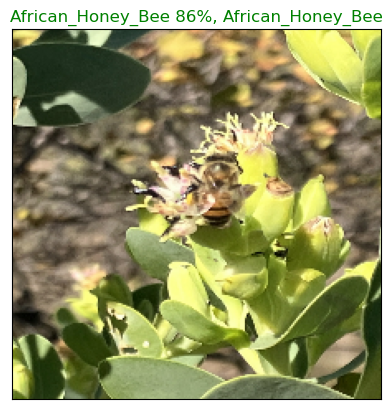

In [57]:
display_prediction(predictions, test_labels, test_images, n=4)

Next, we will set up a data frame to show the accuracy of the final model on the test set by class

In [28]:
def create_pred_df(predictions, test_labels):    
    # First, need to get a list of predicted labels and confidence levels and place them into a pandas series
    pred_labels= []
    confidence = []
    for i in range(len(predictions)):
        pred_labels.append(get_pred_labels(predictions[i]))
        confidence.append(np.max(predictions[i]))
    
    
    pred_labels = pd.Series(pred_labels)
    confidence = pd.Series(confidence)
    
    return pd.DataFrame({'Predicted_Labels': pred_labels,'Confidence': confidence, 'Actual Labels':test_labels})

In [93]:
pred_df = create_pred_df(predictions, test_labels)

In [94]:
# Calculate the percentage of correct predictions for each class
correct = pred_df[pred_df['Predicted_Labels'] == pred_df['Actual Labels']]
percentage_correct = (correct.groupby('Actual Labels').size()/pred_df.groupby('Actual Labels').size())*100
percentage_correct.sort_values(axis=0, inplace=True)

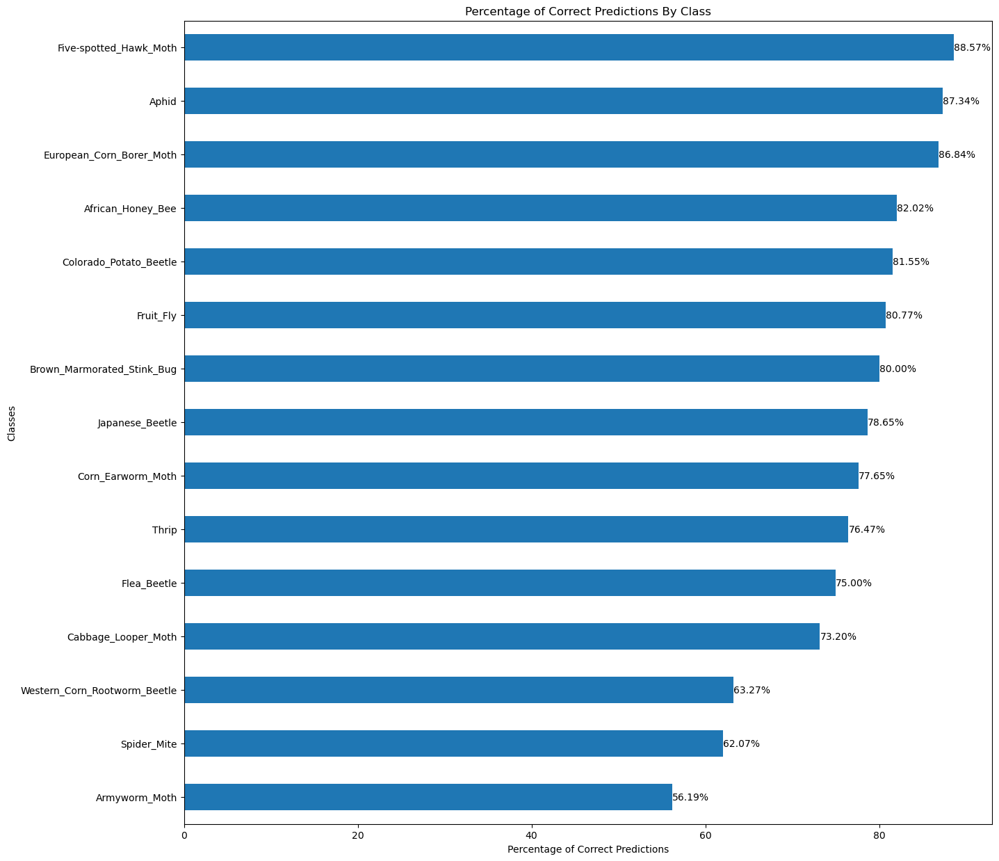

In [95]:
# Plot the correct percentages
percentage_correct.plot(kind = 'barh', figsize=(15, 15))
plt.xlabel('Percentage of Correct Predictions')
plt.ylabel('Classes')
plt.title('Percentage of Correct Predictions By Class')

for index, value in enumerate(percentage_correct):
    plt.text(value, index, f'{value:.2f}%', va='center')
plt.show();

The last visualization we will create for this notebook is a confusion matrix using sk-learn

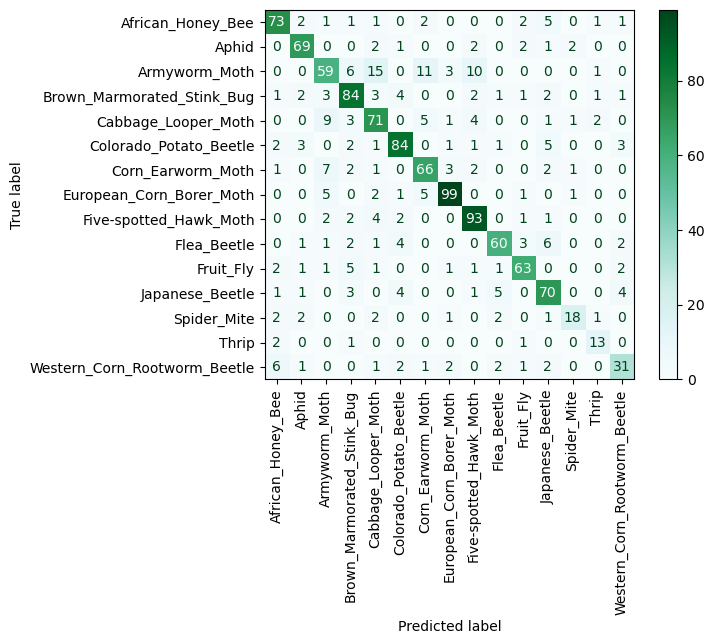

In [96]:
confusion_matrix = ConfusionMatrixDisplay.from_predictions(y_true=test_labels,
                                       y_pred=pred_df.Predicted_Labels,
                                       xticks_rotation='vertical',
                                       cmap='BuGn',
                                       colorbar='False')